In this assignment, you'll get hands-on experience coding and training Generative Adversarial Networks or GANs. We will implement a specific type of GAN designed to process images, called a Deep Convolutional GAN (DCGAN). We'll train the DCGAN to generate natural images from CIFAR10. Let's get started. 


A GAN is a generative model that has the following network structure:

![discriminator](https://drive.google.com/uc?export=view&id=19LkOTaowOrNhIKvjXWvO6qhFVUNZMF5Y)

A DCGAN is simply a GAN that uses a convolutional neural network as the discriminator, and a network composed of transposed convolutions as the generator. To implement the DCGAN, we need to specify three things: 


1.   the Discriminator
2.   the Generator
3.   the training Procedure



## **Part 1: Implement the Discriminator of the DCGAN**

The discriminator in the DCGAN you will implement is a convolutional neural network with the following architecture:

![discriminator](https://drive.google.com/uc?export=view&id=1KrqS_AyjHIm7leVh58pjVRmnGx-le1vB)


1.   **Padding**: In each of the convolutional layers shown above, we downsample the spatial dimension of the input volume by a factor of 2. Given that we kernel size $K=5$ and stride $S=2$, what should the padding be? Write your answer below in the colab, and show your work (i.e. the formula you used to derived the padding.)
2.   **Implementation**: Implement the above architecture in the ```define_discriminator``` routine below and return the model.






## Answer

To get the padding, we can use the equation we learned in class:

$r = \frac {n + 2p - f}{s}  + 1$,

to get the padding p:

$p = \frac {s(r-1) + f - n} {2}$,

where `s = stride = 2`, `f = kernel size = 5`, `p = padding`, `r = resultant dimension = 16`, and `n = input image dimensions = 32`

to get the following:

$p = 2$


##Discriminator Implementation

To define the discriminator, we note the following things about its structure from lecture:

- We can apply Batch Normalization everywhere except the discriminator input
- We use LeakyReLU for the discriminator

To build the model, we simply followed the diagram provided above, where we applies four convolutions. The last convolution we generated a 2x2x256, then applied `Flatten()` and then a FC layer.

In [1]:
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
import numpy as np


def define_discriminator(input_shape=(32,32,3)):
	
	kernel = 5
	stride = 2

	assert input_shape == (32,32,3)
 
	# create model
	model = keras.Sequential()

	# 1st conv
	model.add(keras.layers.Conv2D(filters=32,kernel_size=kernel,padding='same',strides=stride,input_shape=(32,32,3)))
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.25))
	model.add(keras.layers.BatchNormalization())
	# print(f"1st conv2d: output_shape: {model.output_shape}")

	# 2nd conv
	model.add(keras.layers.Conv2D(filters=64,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.25))
	# print(f"2nd conv2d: output_shape: {model.output_shape}")

	# 3rd conv
	model.add(keras.layers.Conv2D(filters=128,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.25))
	# print(f"3rd conv2d: output_shape: {model.output_shape}")
	
	# 4th convolution
	model.add(keras.layers.Conv2D(filters=256,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
 
	# FC layer
	model.add(keras.layers.Flatten())
 
	# output
	model.add(keras.layers.Dense(1 ,activation='sigmoid'))
 
	# define optimizer
	opt = keras.optimizers.Adam(learning_rate=1e-4, beta_1 = 0.9)
	model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['binary_accuracy'])

	return model


Using TensorFlow backend.


## **Part 2: Implement the Generator**

Now, we will implement the generator of the DCGAN in ```define_generator```, which consists of a sequence of transpose convolutional layers that progressively upsample the input noise sample to generate a fake image. Since the training of the generator involves an end-to-end cost function involving both the generator and the discriminator, you should also define a combined GAN model in ``define_gan``. Note that the discriminator portion is frozen (setting ``trainable`` to ``False``) as the weights of the discriminator are not modified during the training of the generator. The generator has the following architecture:

![discriminator](https://drive.google.com/uc?export=view&id=18RwpQChvU1FLfnCEfMiJKsKklsOkDyTS)



##Generator Implementation

To create the generator, we followed the structure presented in class, where:

- We apply Batch Normalization on all layers except for the generator output
- We apply ReLU through the generator except at the output
- At the output, we apply a `tanh` activation


To implement the generator, we also followed the diagram above and played around with the ReLU values. Since the input has an `input_shape` of dimenstion `100`, we made a dense layer and reshaped it to a 4x4x128. Then, we followed the diagram, following the number of filters, kernel stride, and kernel size as specified above. 

For the GAN, we set the discriminator training to `False` because we need to train the discriminator separately. In the GAN, we generate a latent vector of dimension 100 and put it through the generator. Then, we used the output fake image as the input to the discriminator to get a decision. This decision and the original latent vector are used to create the GAN model, since we want an output decision and a model that takes in a latent vector.

In [2]:
# define the standalone generator model
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
import keras.initializers as initializers
import numpy as np

def define_generator(latent_dim=100):

    # create model   
    model = keras.Sequential()

    # reshape input to 4x4x128
    model.add(keras.layers.Dense(4*4*128, input_shape=(latent_dim,)))
    model.add(keras.layers.Reshape((4, 4, 128)))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"after linear and reshape: output_shape: {model.output_shape}")

    # 1st conv
    model.add(keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding='same'))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"1st conv2d_transpose: output_shape: {model.output_shape}")
    
    # 2nd conv
    model.add(keras.layers.Conv2DTranspose(32, kernel_size=5, strides=2, padding='same'))    
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"2nd conv2d_transpose: output_shape: {model.output_shape}")

    # 3rd conv
    model.add(keras.layers.Conv2DTranspose(3, kernel_size=5, strides=2, padding='same', activation='tanh'))
    # print(f"3rd conv2d_transpose: output_shape: {model.output_shape}")

    return model


# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):

  # make weights in the discriminator not trainable
  d_model.trainable = False
  
  # Define your combined model here 
  x = keras.layers.Input(shape=(100,))
  img = g_model(x)
  decision = d_model(img)

  model = keras.models.Model(inputs=x,outputs=decision)
  model.compile(keras.optimizers.Adam(learning_rate=1e-4, beta_1 = 0.9), loss='binary_crossentropy', metrics=['binary_accuracy'])
  return model


# print out discriminator summary
discriminator = define_discriminator()
discriminator.summary()

# print out generator summary
generator = define_generator()
generator.summary()

# print out GAN summary
gan = define_gan(generator, discriminator)
gan.summary()


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 16, 16, 32)        2432      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 16, 16, 32)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 16, 16, 32)        128       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 64)          51264     
_________________________________________________________________
batch_normalization_2 (Batch (None, 8, 8, 64)          256       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 8, 64)         

In [3]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

## **Part 3: Training the model**

Instantiate the following routine ``train`` to train a DCGAN. The basic procedure goes like the followings. For each batch in each epoch: 

1.   Randomly sample a batch size of real images and give each of them a "real" label
2.   Randomly generate a batch size of latent points and create fake images using the generator. Give each fake image a "fake" label.
3.   Use the data from 1 and 2 as training data to train only the discriminator 
4.   Randomly generate a batch size of latent points and create fake images using the generator. Give each fake image a "real" label.
5.   Use the data to train the combined network. 

To monitor the progress, print out the performance of the discriminator network every episode and five randomly generated images every 5 episodes. As the training may take a significant amount of time, please save all the models in ``outputdir`` every episode in case you need to stop and restart the training process. 


##Training Implementation

To train the model, we assume the input dataset `dataset` is already divided into batches. Then, we can iterate through all the batches per epoch. In a single epoch, we convert the batch into a `numpy` list. This batch contains the $real$ $images$ that we will train our disriminator on. The $real$ $images$ are input to the discriminator are given $real$ $labels$ of the value $1$. So we have something like:

`d_loss_real_imgs = d_model.train_on_batch(real_data, np.ones((batch_size,1))`

We do the same thing for $fake$ $images$, where we can generate fake images from the generator model. The output is given $label = 0$, where we have

`d_loss_fake_imgs = d_model.train_on_batch(fake_data, np.zeros((batch_size,1))`

For the GAN, we train it with the input (100,). In the GAN, fake images will be generated and we given then a real label and get the loss.


In [4]:
import time
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
from keras.datasets import cifar10
import numpy as np

batch_size = 128

# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, outputdir='/training_checkpoints/', latent_dim=100, n_epochs=400, n_batch=128):

  print(f"Number of epochs: {n_epochs}")
  print(f"Number of batches: {n_batch}")

  checkpoint_prefix = os.path.join(outputdir, "ckpt")
  model_filename = 'model_checkpoint'

  # go through all batches per epoch
  for epoch in range(n_epochs):

    start = time.time()

    # get a batch of real images and give them a real label
    for data_batch in dataset:

      # convert to numpy array
      # shape: 128x32x32x3
      data = np.stack(list(data_batch))

      # generate noise for creating fake images in step 2
      random_noise = np.random.normal(size=(n_batch,latent_dim))

      # train the discriminator
      d_model.training = True

      # compute the loss for the discriminator - compare the real images with a bunch of ones
      # ones are used to label 'real' images
      d_loss_real_imgs = d_model.train_on_batch(x=data, y=np.ones((128,1)))
      random_img = g_model.predict_on_batch(random_noise)
      d_loss_fake_imgs = d_model.train_on_batch(x=random_img, y=np.zeros((128,1)))

      loss = (d_loss_fake_imgs[0] + d_loss_real_imgs[0])

      d_model.training = False
      gan_loss = gan_model.train_on_batch(x=random_noise,y=np.ones((128,1)))

    print(f"epoch = {epoch+1}/{n_epochs}, d_loss={loss:0.3f}, g_loss={gan_loss[0]:0.3f}")

    if (epoch % 5 == 0):
        samples = 10
        x_fake = g_model.predict(np.random.normal(loc=0, scale=1, size=(samples, latent_dim)))

        for k in range(samples):
            plt.subplot(2, 5, k + 1, xticks=[], yticks=[])
            plt.imshow(((x_fake[k] + 1)* 127).astype(np.uint8))

        plt.tight_layout()
        plt.show()

    if(epoch + 1 % 20 == 0):
      # we will save model checkpoints to continue training in case of kernel death
      # model_filename_gan = 'gan_train.{0:03d}.hdf5'
      # model_filename_g = 'generator_train.{0:03d}.hdf5'
      # model_filename_d = 'discriminator_train.{0:03d}.hdf5'
      model_filename_gan = 'gan_train.hdf5'
      model_filename_g = 'generator_train.hdf5'
      model_filename_d = 'discriminator_train.hdf5'
      save_model(gan, model_filename_gan)
      save_model(gan, model_filename_g)
      save_model(gan, model_filename_d)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))





## **Part 4: Experiment**

This is where you put everything together and test it on CIFAR10. In the other part of the lab, you have already built a classifier for CIFAR10. For this experiment, you will use the same set of training images to build a DCGAN and then use the resulting generator to create 50,000 fake images. These fake images have no class labels but you can predict them using the classifier you built earlier. Now treating these fake images and predicted labels as training data, build a brand new classifier for CIFAR10 and compare its performance with the original one trained on the raw data. 

1.   Comment on any differences between their performances. Without running additional experiments, do you think the performance of the classifier trained on fake images will improve if you use 500,000 fake images instead of 50,000?
2.   You might wonder why anyone would use fake data to train classifier. As it turns out, this is a useful strategy to protect privacy of sensitive original data, especially in frederated learning when sensitive data need to be aggregated from many different sites. Inspecting a random set of fake images, do you think that they disclose any of the raw images from the original CIFAR10 dataset? 





###Answers to Q1 and Q2
1. Based on the results below, the images are much darker compared to the original CIFAR10 classifier trained on the original images. This is because the output images from the 100th epoch after training the DCGAN shows that the images are not clear and are dark in color. Our output from the generator is not that good. If we trained on 500k fake images from the generator, the output would not improve in this case, since the fake images are already wrong. If our DCGAN was well-trained though, then 500k results would improve the NN.

2. For a DCGAN that is working better than ours, then the output images generated by the GAN is different enough from the original images, so the raw images are not disclosed. Therefore, we can use the fake images instead of the original/raw images. Therefore, we believe that privacy comes in tandem with a well-trained model.


#**Experiment Implementation**

As mentioned in the previous instructions, what we did first was training a classifier, like in part 1

In [5]:
import tensorflow as tf
import keras
from keras import backend as K
import numpy as np
import matplotlib.pyplot as plt
from keras.utils import np_utils

# import necessary building blocks
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Sequential
from collections import defaultdict
import tqdm
from keras.models import save_model
from sklearn.metrics import confusion_matrix, accuracy_score
from keras.datasets import cifar10

%tensorflow_version 1.x
%matplotlib inline

TensorFlow is already loaded. Please restart the runtime to change versions.


###Load cifar10 dataset

In [6]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

print("Train samples:", x_train.shape, y_train.shape)
print("Test samples:", x_test.shape, y_test.shape)

NUM_CLASSES = 10
cifar10_classes = ["airplane", "automobile", "bird", "cat", "deer", 
                   "dog", "frog", "horse", "ship", "truck"]

170500096/170498071 [==============================] - 6s 0us/step
Train samples: (50000, 32, 32, 3) (50000, 1)
Test samples: (10000, 32, 32, 3) (10000, 1)


### Prepare data 

We need to normalize inputs like this: $$x_{norm} = \frac{x}{255} - 0.5$$

We need to convert class labels to one-hot encoded vectors. Use __keras.utils.to_categorical__.

In [7]:
# normalize inputs
x_train2  = [((x/255) - 0.5) for x in x_train]
x_train2 = np.array(x_train2)
x_test2   = [((x/255) - 0.5) for x in x_test]
x_test2 = np.array(x_test2)

# convert class labels to one-hot encoded, should have shape (?, NUM_CLASSES)
y_train2 = keras.utils.to_categorical(y_train)
print(y_train2.shape)
y_test2 = keras.utils.to_categorical(y_test)
print(y_test2.shape)

(50000, 10)
(10000, 10)


## Classifier CNN architecture

In [8]:
def make_model():

    NUM_CLASSES = 10

    model = Sequential()  # start feed-forward model definition

    model.add(keras.layers.Conv2D(filters=16, kernel_size=3, padding='same', input_shape=(32, 32, 3)))  # first layer needs to define "input_shape"
    model.add(LeakyReLU(0.1))

    model.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.25))

    model.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(keras.layers.Conv2D(filters=64, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.25))
    model.add(Flatten())

    # model.add(Dense(256, input_shape=(50000,)))
    model.add(Dense(256))
    model.add(LeakyReLU(0.1))
    model.add(Dropout(0.5))
    
    model.add(Dense(NUM_CLASSES))  # the last layer with neuron for each class
    model.add(LeakyReLU(0.1))
    model.add(Activation("softmax"))  # output probabilities
    
    return model
  

### Train model

Training of your model can take approx. 4-8 minutes per epoch. The whole process takes approximately **1.5 hours**. You're aiming for ~0.80 validation accuracy.

During training you should observe the decrease in reported loss on training and validation.

If the loss on training is not decreasing with epochs you should revise your model definition and learning rate.

In [9]:
class TqdmProgressCallback(keras.callbacks.Callback):

    def on_train_begin(self, logs=None):
        self.epochs = self.params['epochs']

    def on_epoch_begin(self, epoch, logs=None):
        print('Epoch %d/%d' % (epoch + 1, self.epochs))
        if "steps" in self.params:
            self.use_steps = True
            self.target = self.params['steps']
        else:
            self.use_steps = False
            self.target = self.params['samples']
        self.prog_bar = tqdm.tqdm_notebook(total=self.target)
        self.log_values_by_metric = defaultdict(list)

    def _set_prog_bar_desc(self, logs):
        for k in self.params['metrics']:
            if k in logs:
                self.log_values_by_metric[k].append(logs[k])
        desc = "; ".join("{0}: {1:.4f}".format(k, np.mean(values)) for k, values in self.log_values_by_metric.items())
        if hasattr(self.prog_bar, "set_description_str"):  # for new tqdm versions
            self.prog_bar.set_description_str(desc)
        else:
            self.prog_bar.set_description(desc)

    def on_batch_end(self, batch, logs=None):
        logs = logs or {}
        if self.use_steps:
            self.prog_bar.update(1)
        else:
            batch_size = logs.get('size', 0)
            self.prog_bar.update(batch_size)
        self._set_prog_bar_desc(logs)

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        self._set_prog_bar_desc(logs)
        self.prog_bar.update(1)  # workaround to show description
        self.prog_bar.close()


class ModelSaveCallback(keras.callbacks.Callback):

    def __init__(self, file_name):
        super(ModelSaveCallback, self).__init__()
        self.file_name = file_name

    def on_epoch_end(self, epoch, logs=None):
        model_filename = self.file_name.format(epoch)
        save_model(self.model, model_filename)
        print("Model saved in {}".format(model_filename))

In [10]:
INIT_LR = 4.5e-3  # initial learning rate
BATCH_SIZE = 32
EPOCHS = 200

model = make_model()  # define our model
model.summary()

# prepare model for fitting (loss, optimizer, etc)
model.compile(
    loss='categorical_crossentropy',  # we train 10-way classification
    optimizer=keras.optimizers.adamax(lr=INIT_LR),  # for SGD
    metrics=['accuracy']  # report accuracy during training
)

# scheduler of learning rate (decay with epochs)
def lr_scheduler(epoch):
    return INIT_LR * 0.9 ** epoch

# callback for printing of actual learning rate used by optimizer
class LrHistory(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
        print("Learning rate:", K.get_value(model.optimizer.lr))


# we will save model checkpoints to continue training in case of kernel death
# model_filename = 'cifar.{0:03d}.hdf5'
model_filename = 'cifar.hdf5'
last_finished_epoch = None
#print(f"x_test2: {len(x_test2)}")

# fit model
model.fit(
    x_train2, y_train2,  # prepared data
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               TqdmProgressCallback(),
               ModelSaveCallback(model_filename)],
    #validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0,
    initial_epoch=last_finished_epoch or 0
)

# save weights to file
model.save_weights("weights.h5")

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 32, 32, 16)        448       
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 32, 32, 32)        4640      
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 32, 32, 32)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 16, 16, 32)       

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  



Model saved in cifar.hdf5
Learning rate: 0.00405
Epoch 2/200



Model saved in cifar.hdf5
Learning rate: 0.003645
Epoch 3/200



Model saved in cifar.hdf5
Learning rate: 0.0032805
Epoch 4/200



Model saved in cifar.hdf5
Learning rate: 0.00295245
Epoch 5/200



Model saved in cifar.hdf5
Learning rate: 0.002657205
Epoch 6/200



Model saved in cifar.hdf5
Learning rate: 0.0023914846
Epoch 7/200



Model saved in cifar.hdf5
Learning rate: 0.002152336
Epoch 8/200



Model saved in cifar.hdf5
Learning rate: 0.0019371024
Epoch 9/200



Model saved in cifar.hdf5
Learning rate: 0.0017433922
Epoch 10/200



Model saved in cifar.hdf5
Learning rate: 0.0015690529
Epoch 11/200



Model saved in cifar.hdf5
Learning rate: 0.0014121477
Epoch 12/200



Model saved in cifar.hdf5
Learning rate: 0.001270933
Epoch 13/200



Model saved in cifar.hdf5
Learning rate: 0.0011438397
Epoch 14/200



Model saved in cifar.hdf5
Learning rate: 0.0010294557
Epoch 15/200



Model saved in cifar.hdf5
Learning rate: 0.0009265101
Epoch 16/200



Model saved in cifar.hdf5
Learning rate: 0.0008338591
Epoch 17/200



Model saved in cifar.hdf5
Learning rate: 0.0007504732
Epoch 18/200



Model saved in cifar.hdf5
Learning rate: 0.00067542586
Epoch 19/200



Model saved in cifar.hdf5
Learning rate: 0.00060788327
Epoch 20/200



Model saved in cifar.hdf5
Learning rate: 0.00054709497
Epoch 21/200



Model saved in cifar.hdf5
Learning rate: 0.0004923855
Epoch 22/200



Model saved in cifar.hdf5
Learning rate: 0.0004431469
Epoch 23/200



Model saved in cifar.hdf5
Learning rate: 0.00039883223
Epoch 24/200



Model saved in cifar.hdf5
Learning rate: 0.000358949
Epoch 25/200



Model saved in cifar.hdf5
Learning rate: 0.0003230541
Epoch 26/200



Model saved in cifar.hdf5
Learning rate: 0.0002907487
Epoch 27/200



Model saved in cifar.hdf5
Learning rate: 0.00026167382
Epoch 28/200



Model saved in cifar.hdf5
Learning rate: 0.00023550644
Epoch 29/200



Model saved in cifar.hdf5
Learning rate: 0.00021195579
Epoch 30/200



Model saved in cifar.hdf5
Learning rate: 0.00019076021
Epoch 31/200



Model saved in cifar.hdf5
Learning rate: 0.0001716842
Epoch 32/200



Model saved in cifar.hdf5
Learning rate: 0.00015451577
Epoch 33/200



Model saved in cifar.hdf5
Learning rate: 0.0001390642
Epoch 34/200



Model saved in cifar.hdf5
Learning rate: 0.00012515778
Epoch 35/200



Model saved in cifar.hdf5
Learning rate: 0.000112641996
Epoch 36/200



Model saved in cifar.hdf5
Learning rate: 0.000101377795
Epoch 37/200



Model saved in cifar.hdf5
Learning rate: 9.124002e-05
Epoch 38/200



Model saved in cifar.hdf5
Learning rate: 8.2116014e-05
Epoch 39/200



Model saved in cifar.hdf5
Learning rate: 7.390441e-05
Epoch 40/200



Model saved in cifar.hdf5
Learning rate: 6.6513974e-05
Epoch 41/200



Model saved in cifar.hdf5
Learning rate: 5.9862577e-05
Epoch 42/200



Model saved in cifar.hdf5
Learning rate: 5.387632e-05
Epoch 43/200



Model saved in cifar.hdf5
Learning rate: 4.8488688e-05
Epoch 44/200



Model saved in cifar.hdf5
Learning rate: 4.363982e-05
Epoch 45/200



Model saved in cifar.hdf5
Learning rate: 3.9275837e-05
Epoch 46/200



Model saved in cifar.hdf5
Learning rate: 3.5348254e-05
Epoch 47/200



Model saved in cifar.hdf5
Learning rate: 3.1813426e-05
Epoch 48/200



Model saved in cifar.hdf5
Learning rate: 2.8632085e-05
Epoch 49/200



Model saved in cifar.hdf5
Learning rate: 2.5768875e-05
Epoch 50/200



Model saved in cifar.hdf5
Learning rate: 2.3191988e-05
Epoch 51/200



Model saved in cifar.hdf5
Learning rate: 2.0872789e-05
Epoch 52/200



Model saved in cifar.hdf5
Learning rate: 1.8785511e-05
Epoch 53/200



Model saved in cifar.hdf5
Learning rate: 1.6906959e-05
Epoch 54/200



Model saved in cifar.hdf5
Learning rate: 1.5216264e-05
Epoch 55/200



Model saved in cifar.hdf5
Learning rate: 1.3694637e-05
Epoch 56/200



Model saved in cifar.hdf5
Learning rate: 1.2325174e-05
Epoch 57/200



Model saved in cifar.hdf5
Learning rate: 1.1092656e-05
Epoch 58/200



Model saved in cifar.hdf5
Learning rate: 9.983391e-06
Epoch 59/200



Model saved in cifar.hdf5
Learning rate: 8.985052e-06
Epoch 60/200



Model saved in cifar.hdf5
Learning rate: 8.086547e-06
Epoch 61/200



Model saved in cifar.hdf5
Learning rate: 7.2778917e-06
Epoch 62/200



Model saved in cifar.hdf5
Learning rate: 6.5501026e-06
Epoch 63/200



Model saved in cifar.hdf5
Learning rate: 5.8950923e-06
Epoch 64/200



Model saved in cifar.hdf5
Learning rate: 5.3055833e-06
Epoch 65/200



Model saved in cifar.hdf5
Learning rate: 4.7750245e-06
Epoch 66/200



Model saved in cifar.hdf5
Learning rate: 4.297522e-06
Epoch 67/200



Model saved in cifar.hdf5
Learning rate: 3.86777e-06
Epoch 68/200



Model saved in cifar.hdf5
Learning rate: 3.480993e-06
Epoch 69/200



Model saved in cifar.hdf5
Learning rate: 3.1328937e-06
Epoch 70/200



Model saved in cifar.hdf5
Learning rate: 2.8196043e-06
Epoch 71/200



Model saved in cifar.hdf5
Learning rate: 2.537644e-06
Epoch 72/200



Model saved in cifar.hdf5
Learning rate: 2.2838794e-06
Epoch 73/200



Model saved in cifar.hdf5
Learning rate: 2.0554917e-06
Epoch 74/200



Model saved in cifar.hdf5
Learning rate: 1.8499425e-06
Epoch 75/200



Model saved in cifar.hdf5
Learning rate: 1.6649482e-06
Epoch 76/200



Model saved in cifar.hdf5
Learning rate: 1.4984533e-06
Epoch 77/200



Model saved in cifar.hdf5
Learning rate: 1.3486081e-06
Epoch 78/200



Model saved in cifar.hdf5
Learning rate: 1.2137472e-06
Epoch 79/200



Model saved in cifar.hdf5
Learning rate: 1.0923725e-06
Epoch 80/200



Model saved in cifar.hdf5
Learning rate: 9.831352e-07
Epoch 81/200



Model saved in cifar.hdf5
Learning rate: 8.848217e-07
Epoch 82/200



Model saved in cifar.hdf5
Learning rate: 7.963396e-07
Epoch 83/200



Model saved in cifar.hdf5
Learning rate: 7.167056e-07
Epoch 84/200



Model saved in cifar.hdf5
Learning rate: 6.45035e-07
Epoch 85/200



Model saved in cifar.hdf5
Learning rate: 5.8053155e-07
Epoch 86/200



Model saved in cifar.hdf5
Learning rate: 5.224784e-07
Epoch 87/200



Model saved in cifar.hdf5
Learning rate: 4.7023053e-07
Epoch 88/200



Model saved in cifar.hdf5
Learning rate: 4.232075e-07
Epoch 89/200



Model saved in cifar.hdf5
Learning rate: 3.8088675e-07
Epoch 90/200



Model saved in cifar.hdf5
Learning rate: 3.4279807e-07
Epoch 91/200



Model saved in cifar.hdf5
Learning rate: 3.0851825e-07
Epoch 92/200



Model saved in cifar.hdf5
Learning rate: 2.7766643e-07
Epoch 93/200



Model saved in cifar.hdf5
Learning rate: 2.4989978e-07
Epoch 94/200



Model saved in cifar.hdf5
Learning rate: 2.2490981e-07
Epoch 95/200



Model saved in cifar.hdf5
Learning rate: 2.0241883e-07
Epoch 96/200



Model saved in cifar.hdf5
Learning rate: 1.8217695e-07
Epoch 97/200



Model saved in cifar.hdf5
Learning rate: 1.6395926e-07
Epoch 98/200



Model saved in cifar.hdf5
Learning rate: 1.4756333e-07
Epoch 99/200



Model saved in cifar.hdf5
Learning rate: 1.3280699e-07
Epoch 100/200



Model saved in cifar.hdf5
Learning rate: 1.1952629e-07
Epoch 101/200



Model saved in cifar.hdf5
Learning rate: 1.0757366e-07
Epoch 102/200



Model saved in cifar.hdf5
Learning rate: 9.68163e-08
Epoch 103/200



Model saved in cifar.hdf5
Learning rate: 8.7134666e-08
Epoch 104/200



Model saved in cifar.hdf5
Learning rate: 7.84212e-08
Epoch 105/200



Model saved in cifar.hdf5
Learning rate: 7.0579084e-08
Epoch 106/200



Model saved in cifar.hdf5
Learning rate: 6.352117e-08
Epoch 107/200



Model saved in cifar.hdf5
Learning rate: 5.7169057e-08
Epoch 108/200



Model saved in cifar.hdf5
Learning rate: 5.145215e-08
Epoch 109/200



Model saved in cifar.hdf5
Learning rate: 4.6306937e-08
Epoch 110/200



Model saved in cifar.hdf5
Learning rate: 4.167624e-08
Epoch 111/200



Model saved in cifar.hdf5
Learning rate: 3.7508617e-08
Epoch 112/200



Model saved in cifar.hdf5
Learning rate: 3.3757757e-08
Epoch 113/200



Model saved in cifar.hdf5
Learning rate: 3.038198e-08
Epoch 114/200



Model saved in cifar.hdf5
Learning rate: 2.7343782e-08
Epoch 115/200



Model saved in cifar.hdf5
Learning rate: 2.4609404e-08
Epoch 116/200



Model saved in cifar.hdf5
Learning rate: 2.2148464e-08
Epoch 117/200



Model saved in cifar.hdf5
Learning rate: 1.9933617e-08
Epoch 118/200



Model saved in cifar.hdf5
Learning rate: 1.7940256e-08
Epoch 119/200



Model saved in cifar.hdf5
Learning rate: 1.614623e-08
Epoch 120/200



Model saved in cifar.hdf5
Learning rate: 1.4531607e-08
Epoch 121/200



Model saved in cifar.hdf5
Learning rate: 1.3078447e-08
Epoch 122/200



Model saved in cifar.hdf5
Learning rate: 1.1770601e-08
Epoch 123/200



Model saved in cifar.hdf5
Learning rate: 1.0593541e-08
Epoch 124/200



Model saved in cifar.hdf5
Learning rate: 9.534188e-09
Epoch 125/200



Model saved in cifar.hdf5
Learning rate: 8.580769e-09
Epoch 126/200



Model saved in cifar.hdf5
Learning rate: 7.722692e-09
Epoch 127/200



Model saved in cifar.hdf5
Learning rate: 6.9504225e-09
Epoch 128/200



Model saved in cifar.hdf5
Learning rate: 6.25538e-09
Epoch 129/200



Model saved in cifar.hdf5
Learning rate: 5.6298424e-09
Epoch 130/200



Model saved in cifar.hdf5
Learning rate: 5.066858e-09
Epoch 131/200



Model saved in cifar.hdf5
Learning rate: 4.5601722e-09
Epoch 132/200



Model saved in cifar.hdf5
Learning rate: 4.1041552e-09
Epoch 133/200



Model saved in cifar.hdf5
Learning rate: 3.6937395e-09
Epoch 134/200



Model saved in cifar.hdf5
Learning rate: 3.3243657e-09
Epoch 135/200



Model saved in cifar.hdf5
Learning rate: 2.991929e-09
Epoch 136/200



Model saved in cifar.hdf5
Learning rate: 2.692736e-09
Epoch 137/200



Model saved in cifar.hdf5
Learning rate: 2.4234625e-09
Epoch 138/200



Model saved in cifar.hdf5
Learning rate: 2.1811162e-09
Epoch 139/200



Model saved in cifar.hdf5
Learning rate: 1.9630046e-09
Epoch 140/200



Model saved in cifar.hdf5
Learning rate: 1.7667042e-09
Epoch 141/200



Model saved in cifar.hdf5
Learning rate: 1.5900338e-09
Epoch 142/200



Model saved in cifar.hdf5
Learning rate: 1.4310304e-09
Epoch 143/200



Model saved in cifar.hdf5
Learning rate: 1.2879273e-09
Epoch 144/200



Model saved in cifar.hdf5
Learning rate: 1.1591346e-09
Epoch 145/200



Model saved in cifar.hdf5
Learning rate: 1.0432212e-09
Epoch 146/200



Model saved in cifar.hdf5
Learning rate: 9.388991e-10
Epoch 147/200



Model saved in cifar.hdf5
Learning rate: 8.450091e-10
Epoch 148/200



Model saved in cifar.hdf5
Learning rate: 7.605082e-10
Epoch 149/200



Model saved in cifar.hdf5
Learning rate: 6.844574e-10
Epoch 150/200



Model saved in cifar.hdf5
Learning rate: 6.1601163e-10
Epoch 151/200



Model saved in cifar.hdf5
Learning rate: 5.544105e-10
Epoch 152/200



Model saved in cifar.hdf5
Learning rate: 4.989694e-10
Epoch 153/200



Model saved in cifar.hdf5
Learning rate: 4.490725e-10
Epoch 154/200



Model saved in cifar.hdf5
Learning rate: 4.0416526e-10
Epoch 155/200



Model saved in cifar.hdf5
Learning rate: 3.6374873e-10
Epoch 156/200



Model saved in cifar.hdf5
Learning rate: 3.2737385e-10
Epoch 157/200



Model saved in cifar.hdf5
Learning rate: 2.9463645e-10
Epoch 158/200



Model saved in cifar.hdf5
Learning rate: 2.6517283e-10
Epoch 159/200



Model saved in cifar.hdf5
Learning rate: 2.3865554e-10
Epoch 160/200



Model saved in cifar.hdf5
Learning rate: 2.1478998e-10
Epoch 161/200



Model saved in cifar.hdf5
Learning rate: 1.9331098e-10
Epoch 162/200



Model saved in cifar.hdf5
Learning rate: 1.7397989e-10
Epoch 163/200



Model saved in cifar.hdf5
Learning rate: 1.565819e-10
Epoch 164/200



Model saved in cifar.hdf5
Learning rate: 1.409237e-10
Epoch 165/200



Model saved in cifar.hdf5
Learning rate: 1.2683134e-10
Epoch 166/200



Model saved in cifar.hdf5
Learning rate: 1.14148205e-10
Epoch 167/200



Model saved in cifar.hdf5
Learning rate: 1.02733384e-10
Epoch 168/200



Model saved in cifar.hdf5
Learning rate: 9.246005e-11
Epoch 169/200



Model saved in cifar.hdf5
Learning rate: 8.321404e-11
Epoch 170/200



Model saved in cifar.hdf5
Learning rate: 7.4892634e-11
Epoch 171/200



Model saved in cifar.hdf5
Learning rate: 6.7403375e-11
Epoch 172/200



Model saved in cifar.hdf5
Learning rate: 6.066304e-11
Epoch 173/200



Model saved in cifar.hdf5
Learning rate: 5.4596733e-11
Epoch 174/200



Model saved in cifar.hdf5
Learning rate: 4.913706e-11
Epoch 175/200



Model saved in cifar.hdf5
Learning rate: 4.4223354e-11
Epoch 176/200



Model saved in cifar.hdf5
Learning rate: 3.9801017e-11
Epoch 177/200



Model saved in cifar.hdf5
Learning rate: 3.5820916e-11
Epoch 178/200



Model saved in cifar.hdf5
Learning rate: 3.2238823e-11
Epoch 179/200



Model saved in cifar.hdf5
Learning rate: 2.9014941e-11
Epoch 180/200



Model saved in cifar.hdf5
Learning rate: 2.6113448e-11
Epoch 181/200



Model saved in cifar.hdf5
Learning rate: 2.3502103e-11
Epoch 182/200



Model saved in cifar.hdf5
Learning rate: 2.1151893e-11
Epoch 183/200



Model saved in cifar.hdf5
Learning rate: 1.9036703e-11
Epoch 184/200



Model saved in cifar.hdf5
Learning rate: 1.7133033e-11
Epoch 185/200



Model saved in cifar.hdf5
Learning rate: 1.541973e-11
Epoch 186/200



Model saved in cifar.hdf5
Learning rate: 1.3877757e-11
Epoch 187/200



Model saved in cifar.hdf5
Learning rate: 1.2489981e-11
Epoch 188/200



Model saved in cifar.hdf5
Learning rate: 1.1240983e-11
Epoch 189/200



Model saved in cifar.hdf5
Learning rate: 1.0116885e-11
Epoch 190/200



Model saved in cifar.hdf5
Learning rate: 9.105196e-12
Epoch 191/200



Model saved in cifar.hdf5
Learning rate: 8.194677e-12
Epoch 192/200



Model saved in cifar.hdf5
Learning rate: 7.375209e-12
Epoch 193/200



Model saved in cifar.hdf5
Learning rate: 6.637688e-12
Epoch 194/200



Model saved in cifar.hdf5
Learning rate: 5.9739193e-12
Epoch 195/200



Model saved in cifar.hdf5
Learning rate: 5.3765273e-12
Epoch 196/200



Model saved in cifar.hdf5
Learning rate: 4.8388745e-12
Epoch 197/200



Model saved in cifar.hdf5
Learning rate: 4.3549873e-12
Epoch 198/200



Model saved in cifar.hdf5
Learning rate: 3.9194884e-12
Epoch 199/200



Model saved in cifar.hdf5
Learning rate: 3.5275396e-12
Epoch 200/200



Model saved in cifar.hdf5


###Evaluate model

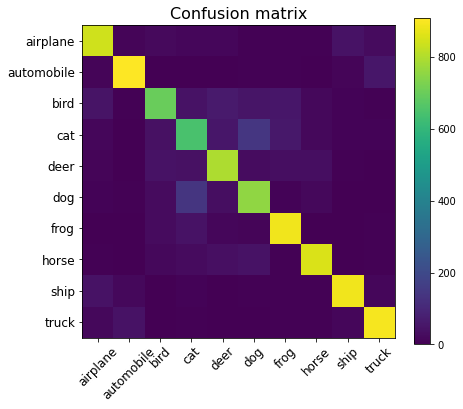

Test accuracy: 0.8172


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:28: MatplotlibDeprecationWarning: Passing unsupported keyword arguments to axis() will raise a TypeError in 3.3.


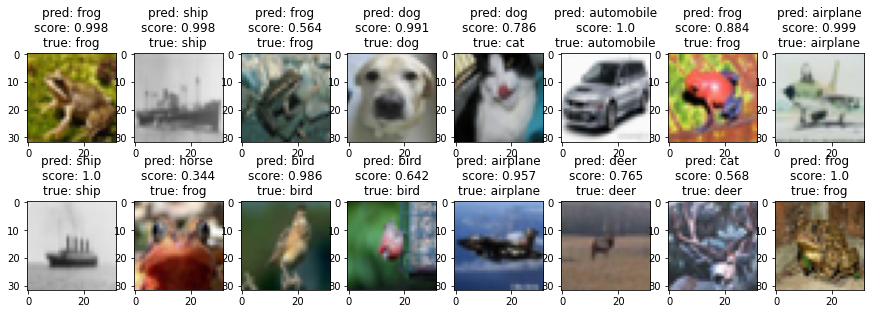

In [11]:
# load weights from file (can call without model.fit)
model.load_weights("weights.h5")

# make test predictions
y_pred_test = model.predict_proba(x_test2)
y_pred_test_classes = np.argmax(y_pred_test, axis=1)
y_pred_test_max_probas = np.max(y_pred_test, axis=1)

# Show the confusion matrix and accuracy
plt.figure(figsize=(7, 6))
plt.title('Confusion matrix', fontsize=16)
plt.imshow(confusion_matrix(y_test, y_pred_test_classes))
plt.xticks(np.arange(10), cifar10_classes, rotation=45, fontsize=12)
plt.yticks(np.arange(10), cifar10_classes, fontsize=12)
plt.colorbar()
plt.show()
print("Test accuracy:", accuracy_score(y_test, y_pred_test_classes))

# inspect preditions
cols = 8
rows = 2
fig = plt.figure(figsize=(2 * cols - 1, 3 * rows - 1))
for i in range(cols):
    for j in range(rows):
        random_index = np.random.randint(0, len(y_test))
        ax = fig.add_subplot(rows, cols, i * rows + j + 1)
        ax.grid(b=False)
        ax.axis(b=False)
        ax.imshow(x_test[random_index, :])
        pred_label = cifar10_classes[y_pred_test_classes[random_index]]
        pred_proba = y_pred_test_max_probas[random_index]
        true_label = cifar10_classes[y_test[random_index, 0]]
        ax.set_title("pred: {}\nscore: {:.3}\ntrue: {}".format(
               pred_label, pred_proba, true_label
        ))
plt.show()

##Experiment
The implementation for the experiment follows the steps below in the code given by the original problem description. Here we used the model of the above classifier c, and then used it to train the fake images generated from the generator, and finally used the fake labels and the fake images to train the classifier c'. The result shows that the acccuracy of the classifier c is 0.7919 and the accuracy of the classifier c' is 0.1. In the training process, the epoch was set to 200 in order to see if there's an improved result compared to epoch = 100. However, the results were not improved much and the potential reson is due to the training for the original classifier still need to be improved in oder to get a better result for the classifier c'. 

Number of epochs: 400
Number of batches: 128


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


epoch = 1/400, d_loss=0.007, g_loss=6.420


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:58: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


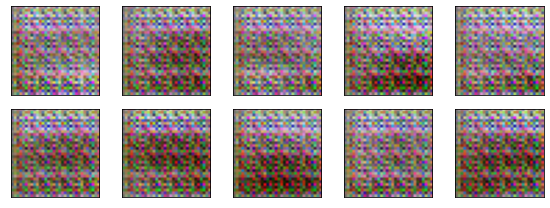

Time for epoch 1 is 68.18422889709473 sec
epoch = 2/400, d_loss=0.015, g_loss=4.883
Time for epoch 2 is 60.19590187072754 sec
epoch = 3/400, d_loss=0.012, g_loss=6.629
Time for epoch 3 is 60.108811140060425 sec
epoch = 4/400, d_loss=0.002, g_loss=1.068
Time for epoch 4 is 60.15339636802673 sec
epoch = 5/400, d_loss=0.004, g_loss=7.534
Time for epoch 5 is 60.54912972450256 sec
epoch = 6/400, d_loss=0.000, g_loss=16.588


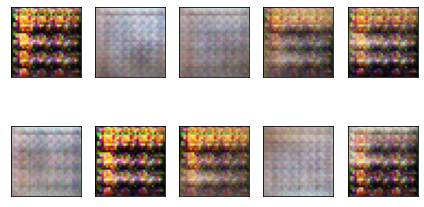

Time for epoch 6 is 60.7018141746521 sec
epoch = 7/400, d_loss=0.001, g_loss=7.335
Time for epoch 7 is 59.86560821533203 sec
epoch = 8/400, d_loss=0.001, g_loss=5.300
Time for epoch 8 is 60.022902727127075 sec
epoch = 9/400, d_loss=0.016, g_loss=1.258
Time for epoch 9 is 59.898640632629395 sec
epoch = 10/400, d_loss=0.000, g_loss=11.744
Time for epoch 10 is 60.61263942718506 sec
epoch = 11/400, d_loss=0.024, g_loss=7.580


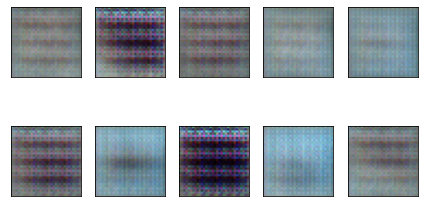

Time for epoch 11 is 60.80105137825012 sec
epoch = 12/400, d_loss=1.255, g_loss=0.468
Time for epoch 12 is 60.18646502494812 sec
epoch = 13/400, d_loss=0.796, g_loss=0.692
Time for epoch 13 is 60.219446897506714 sec
epoch = 14/400, d_loss=0.001, g_loss=12.765
Time for epoch 14 is 60.04079222679138 sec
epoch = 15/400, d_loss=0.389, g_loss=2.225
Time for epoch 15 is 60.5366325378418 sec
epoch = 16/400, d_loss=0.004, g_loss=3.335


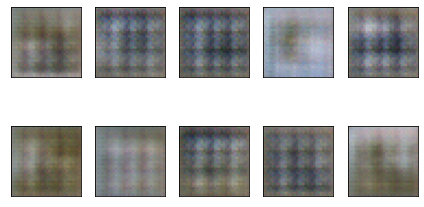

Time for epoch 16 is 60.760669469833374 sec
epoch = 17/400, d_loss=0.029, g_loss=2.228
Time for epoch 17 is 60.26154637336731 sec
epoch = 18/400, d_loss=0.025, g_loss=9.303
Time for epoch 18 is 60.09169554710388 sec
epoch = 19/400, d_loss=0.028, g_loss=4.077
Time for epoch 19 is 59.9396231174469 sec
epoch = 20/400, d_loss=0.049, g_loss=5.244
Time for epoch 20 is 60.5504195690155 sec
epoch = 21/400, d_loss=0.002, g_loss=7.154


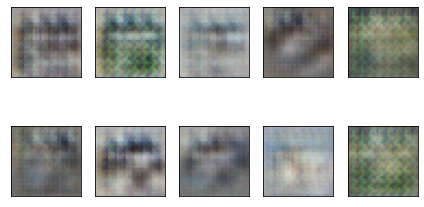

Time for epoch 21 is 60.495718240737915 sec
epoch = 22/400, d_loss=0.091, g_loss=3.879
Time for epoch 22 is 60.15033006668091 sec
epoch = 23/400, d_loss=0.035, g_loss=4.572
Time for epoch 23 is 60.07922077178955 sec
epoch = 24/400, d_loss=0.171, g_loss=7.220
Time for epoch 24 is 60.07119846343994 sec
epoch = 25/400, d_loss=0.052, g_loss=13.123
Time for epoch 25 is 60.55391550064087 sec
epoch = 26/400, d_loss=0.047, g_loss=8.220


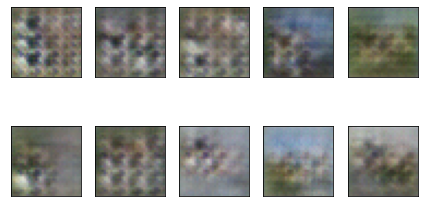

Time for epoch 26 is 60.65858554840088 sec
epoch = 27/400, d_loss=0.168, g_loss=3.271
Time for epoch 27 is 60.27031421661377 sec
epoch = 28/400, d_loss=0.000, g_loss=12.347
Time for epoch 28 is 59.948525190353394 sec
epoch = 29/400, d_loss=0.103, g_loss=3.528
Time for epoch 29 is 59.96225142478943 sec
epoch = 30/400, d_loss=0.001, g_loss=7.563
Time for epoch 30 is 62.32564425468445 sec
epoch = 31/400, d_loss=0.119, g_loss=4.313


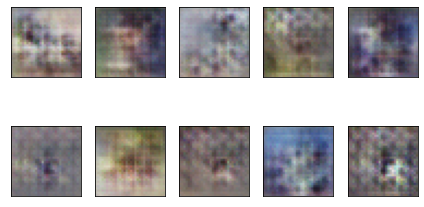

Time for epoch 31 is 62.47253894805908 sec
epoch = 32/400, d_loss=0.151, g_loss=14.110
Time for epoch 32 is 62.3302640914917 sec
epoch = 33/400, d_loss=0.005, g_loss=6.753
Time for epoch 33 is 62.09064769744873 sec
epoch = 34/400, d_loss=0.000, g_loss=7.693
Time for epoch 34 is 61.929869413375854 sec
epoch = 35/400, d_loss=0.002, g_loss=8.036
Time for epoch 35 is 62.4935040473938 sec
epoch = 36/400, d_loss=0.048, g_loss=7.655


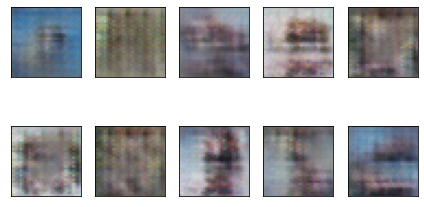

Time for epoch 36 is 62.45347261428833 sec
epoch = 37/400, d_loss=0.021, g_loss=6.777
Time for epoch 37 is 61.918349742889404 sec
epoch = 38/400, d_loss=0.002, g_loss=8.484
Time for epoch 38 is 61.981584787368774 sec
epoch = 39/400, d_loss=0.007, g_loss=5.369
Time for epoch 39 is 62.097529888153076 sec
epoch = 40/400, d_loss=0.002, g_loss=22.839
Time for epoch 40 is 62.30582785606384 sec
epoch = 41/400, d_loss=0.228, g_loss=5.295


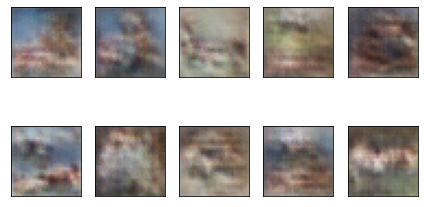

Time for epoch 41 is 62.32742953300476 sec
epoch = 42/400, d_loss=0.001, g_loss=12.162
Time for epoch 42 is 62.14535331726074 sec
epoch = 43/400, d_loss=0.041, g_loss=5.392
Time for epoch 43 is 62.18112850189209 sec
epoch = 44/400, d_loss=0.025, g_loss=7.238
Time for epoch 44 is 61.84053158760071 sec
epoch = 45/400, d_loss=0.022, g_loss=6.527
Time for epoch 45 is 62.133885622024536 sec
epoch = 46/400, d_loss=0.003, g_loss=11.163


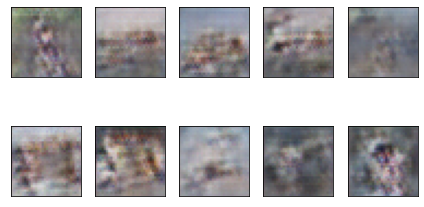

Time for epoch 46 is 62.6695921421051 sec
epoch = 47/400, d_loss=0.021, g_loss=6.357
Time for epoch 47 is 61.99759888648987 sec
epoch = 48/400, d_loss=0.056, g_loss=5.979
Time for epoch 48 is 61.91475963592529 sec
epoch = 49/400, d_loss=0.129, g_loss=1.775
Time for epoch 49 is 62.128562211990356 sec
epoch = 50/400, d_loss=0.001, g_loss=9.503
Time for epoch 50 is 62.62312173843384 sec
epoch = 51/400, d_loss=0.000, g_loss=13.531


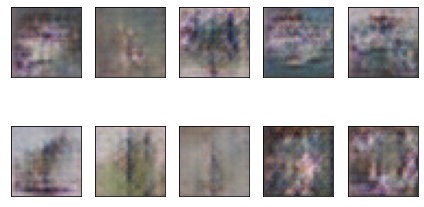

Time for epoch 51 is 62.56822490692139 sec
epoch = 52/400, d_loss=0.005, g_loss=8.483
Time for epoch 52 is 62.00144171714783 sec
epoch = 53/400, d_loss=0.009, g_loss=3.467
Time for epoch 53 is 61.943254709243774 sec
epoch = 54/400, d_loss=0.025, g_loss=4.726
Time for epoch 54 is 61.94759154319763 sec
epoch = 55/400, d_loss=0.035, g_loss=5.320
Time for epoch 55 is 62.587324142456055 sec
epoch = 56/400, d_loss=0.040, g_loss=4.693


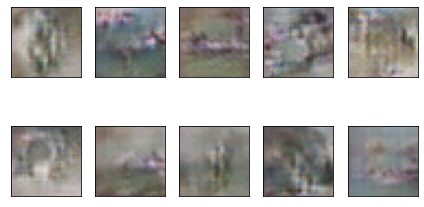

Time for epoch 56 is 62.95405864715576 sec
epoch = 57/400, d_loss=0.019, g_loss=7.737
Time for epoch 57 is 61.836305379867554 sec
epoch = 58/400, d_loss=0.070, g_loss=8.661
Time for epoch 58 is 62.933671712875366 sec
epoch = 59/400, d_loss=0.016, g_loss=7.166
Time for epoch 59 is 62.66759777069092 sec
epoch = 60/400, d_loss=0.318, g_loss=2.184
Time for epoch 60 is 62.815834283828735 sec
epoch = 61/400, d_loss=0.011, g_loss=15.321


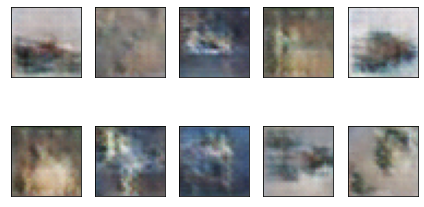

Time for epoch 61 is 61.544626235961914 sec
epoch = 62/400, d_loss=0.106, g_loss=1.700
Time for epoch 62 is 60.90179395675659 sec
epoch = 63/400, d_loss=0.043, g_loss=5.683
Time for epoch 63 is 61.01721692085266 sec
epoch = 64/400, d_loss=0.002, g_loss=7.265
Time for epoch 64 is 61.027496099472046 sec
epoch = 65/400, d_loss=0.002, g_loss=6.531
Time for epoch 65 is 61.57060885429382 sec
epoch = 66/400, d_loss=0.001, g_loss=8.299


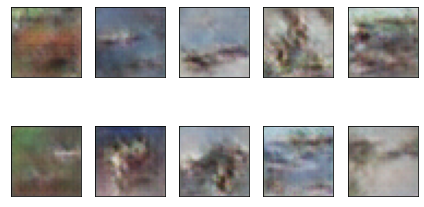

Time for epoch 66 is 61.837621212005615 sec
epoch = 67/400, d_loss=0.020, g_loss=6.074
Time for epoch 67 is 61.15028214454651 sec
epoch = 68/400, d_loss=0.009, g_loss=5.830
Time for epoch 68 is 60.36614203453064 sec
epoch = 69/400, d_loss=0.001, g_loss=9.442
Time for epoch 69 is 60.319581031799316 sec
epoch = 70/400, d_loss=0.131, g_loss=10.346
Time for epoch 70 is 60.90127396583557 sec
epoch = 71/400, d_loss=0.021, g_loss=2.857


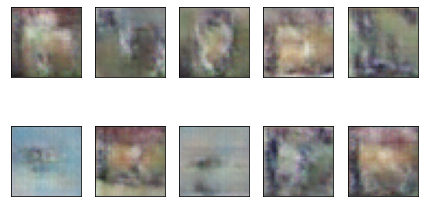

Time for epoch 71 is 60.986732721328735 sec
epoch = 72/400, d_loss=0.077, g_loss=5.712
Time for epoch 72 is 60.354825496673584 sec
epoch = 73/400, d_loss=0.072, g_loss=3.898
Time for epoch 73 is 60.20117712020874 sec
epoch = 74/400, d_loss=0.005, g_loss=8.295
Time for epoch 74 is 60.29034423828125 sec
epoch = 75/400, d_loss=0.057, g_loss=6.526
Time for epoch 75 is 60.11659216880798 sec
epoch = 76/400, d_loss=0.204, g_loss=3.205


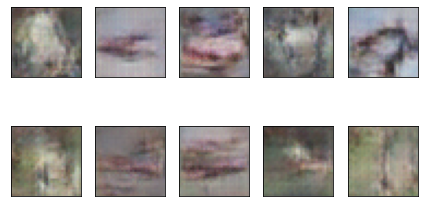

Time for epoch 76 is 61.189515352249146 sec
epoch = 77/400, d_loss=0.125, g_loss=2.356
Time for epoch 77 is 60.133185625076294 sec
epoch = 78/400, d_loss=0.273, g_loss=3.470
Time for epoch 78 is 59.87828493118286 sec
epoch = 79/400, d_loss=0.005, g_loss=5.664
Time for epoch 79 is 60.086143255233765 sec
epoch = 80/400, d_loss=0.006, g_loss=10.003
Time for epoch 80 is 60.11108660697937 sec
epoch = 81/400, d_loss=0.004, g_loss=8.549


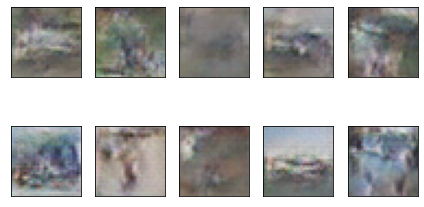

Time for epoch 81 is 61.44212007522583 sec
epoch = 82/400, d_loss=0.420, g_loss=3.665
Time for epoch 82 is 60.11196041107178 sec
epoch = 83/400, d_loss=0.006, g_loss=8.677
Time for epoch 83 is 60.05347537994385 sec
epoch = 84/400, d_loss=0.047, g_loss=4.098
Time for epoch 84 is 60.07864260673523 sec
epoch = 85/400, d_loss=0.168, g_loss=4.570
Time for epoch 85 is 60.250221252441406 sec
epoch = 86/400, d_loss=0.015, g_loss=5.947


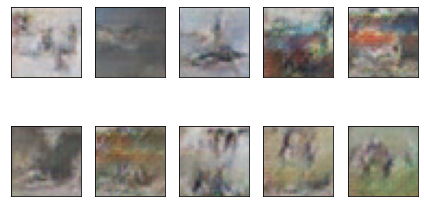

Time for epoch 86 is 61.331072092056274 sec
epoch = 87/400, d_loss=0.249, g_loss=12.183
Time for epoch 87 is 60.129647731781006 sec
epoch = 88/400, d_loss=0.003, g_loss=7.179
Time for epoch 88 is 60.035242795944214 sec
epoch = 89/400, d_loss=0.003, g_loss=5.178
Time for epoch 89 is 60.09656047821045 sec
epoch = 90/400, d_loss=0.100, g_loss=5.975
Time for epoch 90 is 60.03844499588013 sec
epoch = 91/400, d_loss=0.018, g_loss=7.544


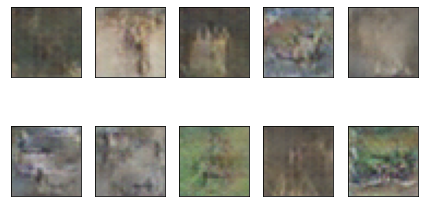

Time for epoch 91 is 61.32868146896362 sec
epoch = 92/400, d_loss=0.277, g_loss=3.920
Time for epoch 92 is 60.1618230342865 sec
epoch = 93/400, d_loss=0.075, g_loss=6.759
Time for epoch 93 is 60.16995048522949 sec
epoch = 94/400, d_loss=0.010, g_loss=12.418
Time for epoch 94 is 60.282207012176514 sec
epoch = 95/400, d_loss=0.014, g_loss=5.621
Time for epoch 95 is 60.63224387168884 sec
epoch = 96/400, d_loss=0.014, g_loss=5.193


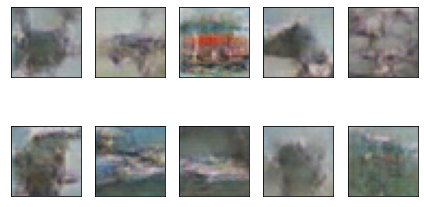

Time for epoch 96 is 62.164767265319824 sec
epoch = 97/400, d_loss=0.085, g_loss=9.136
Time for epoch 97 is 60.54190230369568 sec
epoch = 98/400, d_loss=0.163, g_loss=3.364
Time for epoch 98 is 60.43022847175598 sec
epoch = 99/400, d_loss=0.146, g_loss=3.330
Time for epoch 99 is 60.25576853752136 sec
epoch = 100/400, d_loss=0.006, g_loss=7.112
Time for epoch 100 is 60.489317893981934 sec
epoch = 101/400, d_loss=0.288, g_loss=7.509


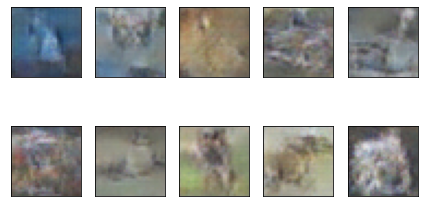

Time for epoch 101 is 61.530956745147705 sec
epoch = 102/400, d_loss=0.082, g_loss=4.914
Time for epoch 102 is 60.259790897369385 sec
epoch = 103/400, d_loss=0.782, g_loss=2.366
Time for epoch 103 is 59.97803449630737 sec
epoch = 104/400, d_loss=0.089, g_loss=3.545
Time for epoch 104 is 59.90341782569885 sec
epoch = 105/400, d_loss=0.006, g_loss=6.312
Time for epoch 105 is 59.924980878829956 sec
epoch = 106/400, d_loss=0.007, g_loss=4.969


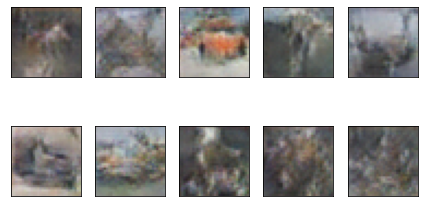

Time for epoch 106 is 61.03195095062256 sec
epoch = 107/400, d_loss=0.235, g_loss=4.436
Time for epoch 107 is 60.37957739830017 sec
epoch = 108/400, d_loss=0.004, g_loss=6.115
Time for epoch 108 is 59.960257053375244 sec
epoch = 109/400, d_loss=0.025, g_loss=4.720
Time for epoch 109 is 60.09158945083618 sec
epoch = 110/400, d_loss=0.006, g_loss=3.447
Time for epoch 110 is 59.89560627937317 sec
epoch = 111/400, d_loss=0.139, g_loss=4.063


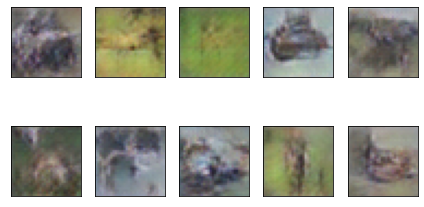

Time for epoch 111 is 60.67912697792053 sec
epoch = 112/400, d_loss=0.007, g_loss=6.641
Time for epoch 112 is 61.202025413513184 sec
epoch = 113/400, d_loss=0.193, g_loss=3.309
Time for epoch 113 is 60.22930836677551 sec
epoch = 114/400, d_loss=0.066, g_loss=6.146
Time for epoch 114 is 60.018083572387695 sec
epoch = 115/400, d_loss=0.027, g_loss=5.394
Time for epoch 115 is 60.26589632034302 sec
epoch = 116/400, d_loss=0.261, g_loss=4.971


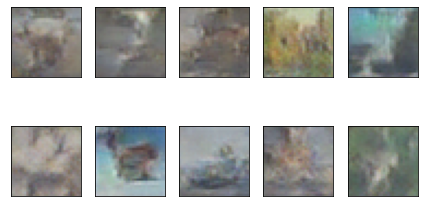

Time for epoch 116 is 60.74498152732849 sec
epoch = 117/400, d_loss=0.001, g_loss=6.315
Time for epoch 117 is 60.88437557220459 sec
epoch = 118/400, d_loss=0.059, g_loss=6.490
Time for epoch 118 is 60.088443994522095 sec
epoch = 119/400, d_loss=0.025, g_loss=3.541
Time for epoch 119 is 60.07014322280884 sec
epoch = 120/400, d_loss=0.019, g_loss=6.912
Time for epoch 120 is 60.13706398010254 sec
epoch = 121/400, d_loss=0.050, g_loss=3.792


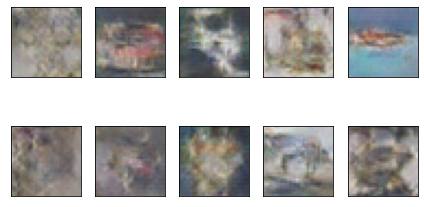

Time for epoch 121 is 60.539793252944946 sec
epoch = 122/400, d_loss=0.026, g_loss=10.313
Time for epoch 122 is 60.86690950393677 sec
epoch = 123/400, d_loss=0.040, g_loss=4.698
Time for epoch 123 is 60.097949504852295 sec
epoch = 124/400, d_loss=0.100, g_loss=4.924
Time for epoch 124 is 60.158979415893555 sec
epoch = 125/400, d_loss=0.206, g_loss=1.220
Time for epoch 125 is 60.01970148086548 sec
epoch = 126/400, d_loss=0.075, g_loss=4.874


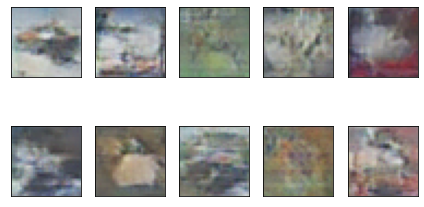

Time for epoch 126 is 60.75084161758423 sec
epoch = 127/400, d_loss=0.010, g_loss=4.922
Time for epoch 127 is 61.011170625686646 sec
epoch = 128/400, d_loss=0.092, g_loss=6.879
Time for epoch 128 is 59.99247193336487 sec
epoch = 129/400, d_loss=0.011, g_loss=10.972
Time for epoch 129 is 60.034379959106445 sec
epoch = 130/400, d_loss=0.029, g_loss=3.111
Time for epoch 130 is 59.98938179016113 sec
epoch = 131/400, d_loss=0.061, g_loss=4.186


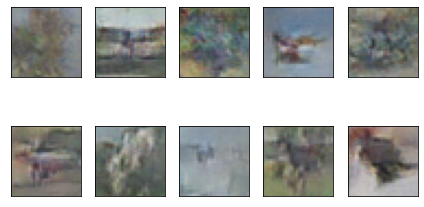

Time for epoch 131 is 60.51917004585266 sec
epoch = 132/400, d_loss=0.007, g_loss=4.131
Time for epoch 132 is 61.43672251701355 sec
epoch = 133/400, d_loss=0.222, g_loss=8.361
Time for epoch 133 is 59.948899030685425 sec
epoch = 134/400, d_loss=0.187, g_loss=6.485
Time for epoch 134 is 60.178189754486084 sec
epoch = 135/400, d_loss=0.014, g_loss=6.589
Time for epoch 135 is 60.34041452407837 sec
epoch = 136/400, d_loss=0.079, g_loss=6.088


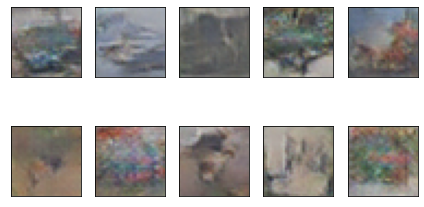

Time for epoch 136 is 60.914958477020264 sec
epoch = 137/400, d_loss=0.064, g_loss=5.433
Time for epoch 137 is 60.950488805770874 sec
epoch = 138/400, d_loss=0.927, g_loss=7.594
Time for epoch 138 is 60.159358501434326 sec
epoch = 139/400, d_loss=0.037, g_loss=5.033
Time for epoch 139 is 60.142271757125854 sec
epoch = 140/400, d_loss=0.019, g_loss=2.466
Time for epoch 140 is 60.21763277053833 sec
epoch = 141/400, d_loss=0.107, g_loss=2.875


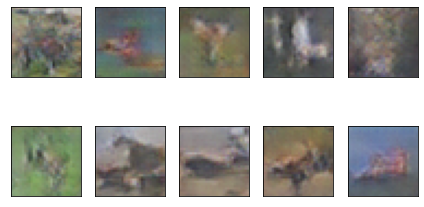

Time for epoch 141 is 60.69847297668457 sec
epoch = 142/400, d_loss=1.607, g_loss=3.176
Time for epoch 142 is 60.75616192817688 sec
epoch = 143/400, d_loss=0.051, g_loss=10.478
Time for epoch 143 is 60.58872580528259 sec
epoch = 144/400, d_loss=0.273, g_loss=5.818
Time for epoch 144 is 60.150763273239136 sec
epoch = 145/400, d_loss=0.365, g_loss=3.817
Time for epoch 145 is 60.22869324684143 sec
epoch = 146/400, d_loss=0.129, g_loss=2.218


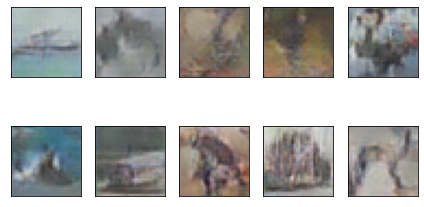

Time for epoch 146 is 60.777708530426025 sec
epoch = 147/400, d_loss=0.051, g_loss=3.861
Time for epoch 147 is 60.51699900627136 sec
epoch = 148/400, d_loss=0.080, g_loss=2.532
Time for epoch 148 is 60.75443124771118 sec
epoch = 149/400, d_loss=0.181, g_loss=4.806
Time for epoch 149 is 60.360682010650635 sec
epoch = 150/400, d_loss=0.009, g_loss=7.535
Time for epoch 150 is 60.11250710487366 sec
epoch = 151/400, d_loss=0.036, g_loss=4.656


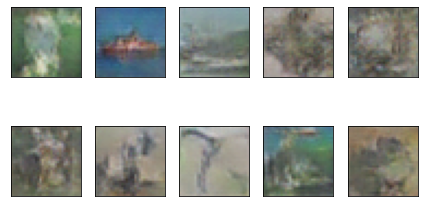

Time for epoch 151 is 60.818504333496094 sec
epoch = 152/400, d_loss=0.002, g_loss=6.667
Time for epoch 152 is 60.583072900772095 sec
epoch = 153/400, d_loss=0.738, g_loss=3.566
Time for epoch 153 is 60.861289739608765 sec
epoch = 154/400, d_loss=0.845, g_loss=9.892
Time for epoch 154 is 60.15882921218872 sec
epoch = 155/400, d_loss=0.008, g_loss=4.701
Time for epoch 155 is 60.372302532196045 sec
epoch = 156/400, d_loss=0.036, g_loss=6.262


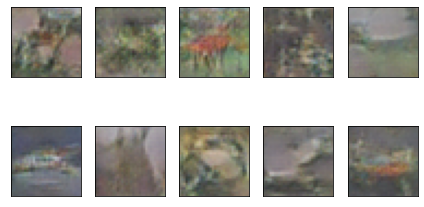

Time for epoch 156 is 61.00583267211914 sec
epoch = 157/400, d_loss=0.009, g_loss=7.079
Time for epoch 157 is 60.905184507369995 sec
epoch = 158/400, d_loss=0.145, g_loss=4.800
Time for epoch 158 is 61.02141356468201 sec
epoch = 159/400, d_loss=0.104, g_loss=4.927
Time for epoch 159 is 60.60107707977295 sec
epoch = 160/400, d_loss=0.180, g_loss=3.012
Time for epoch 160 is 60.45889186859131 sec
epoch = 161/400, d_loss=0.020, g_loss=2.422


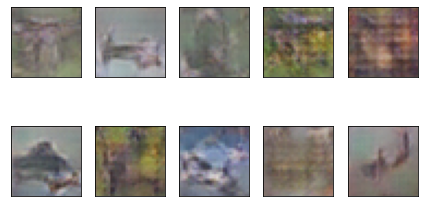

Time for epoch 161 is 61.09323024749756 sec
epoch = 162/400, d_loss=0.017, g_loss=5.318
Time for epoch 162 is 60.8476459980011 sec
epoch = 163/400, d_loss=0.205, g_loss=3.761
Time for epoch 163 is 60.4469575881958 sec
epoch = 164/400, d_loss=0.028, g_loss=5.695
Time for epoch 164 is 60.21470594406128 sec
epoch = 165/400, d_loss=0.013, g_loss=3.463
Time for epoch 165 is 60.42590546607971 sec
epoch = 166/400, d_loss=0.307, g_loss=2.246


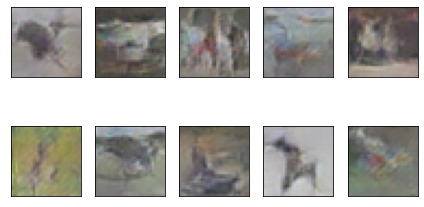

Time for epoch 166 is 60.86334991455078 sec
epoch = 167/400, d_loss=0.354, g_loss=1.844
Time for epoch 167 is 60.65158772468567 sec
epoch = 168/400, d_loss=0.009, g_loss=7.383
Time for epoch 168 is 60.698041915893555 sec
epoch = 169/400, d_loss=0.061, g_loss=1.777
Time for epoch 169 is 59.49081587791443 sec
epoch = 170/400, d_loss=0.005, g_loss=5.159
Time for epoch 170 is 59.61975955963135 sec
epoch = 171/400, d_loss=0.036, g_loss=6.209


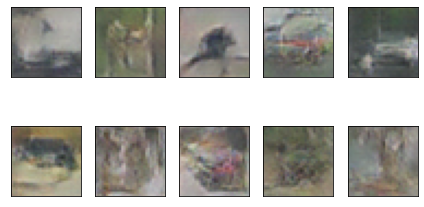

Time for epoch 171 is 59.8106906414032 sec
epoch = 172/400, d_loss=0.023, g_loss=6.260
Time for epoch 172 is 59.63463354110718 sec
epoch = 173/400, d_loss=0.140, g_loss=4.390
Time for epoch 173 is 59.754268169403076 sec
epoch = 174/400, d_loss=0.017, g_loss=4.996
Time for epoch 174 is 59.43935680389404 sec
epoch = 175/400, d_loss=0.378, g_loss=2.723
Time for epoch 175 is 60.45398020744324 sec
epoch = 176/400, d_loss=0.003, g_loss=9.777


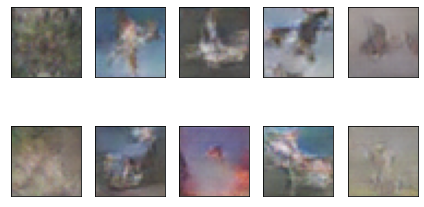

Time for epoch 176 is 61.0572292804718 sec
epoch = 177/400, d_loss=0.026, g_loss=5.425
Time for epoch 177 is 60.55669164657593 sec
epoch = 178/400, d_loss=0.005, g_loss=7.301
Time for epoch 178 is 60.46518015861511 sec
epoch = 179/400, d_loss=0.008, g_loss=3.053
Time for epoch 179 is 60.13407325744629 sec
epoch = 180/400, d_loss=0.062, g_loss=3.749
Time for epoch 180 is 60.070390701293945 sec
epoch = 181/400, d_loss=0.110, g_loss=6.185


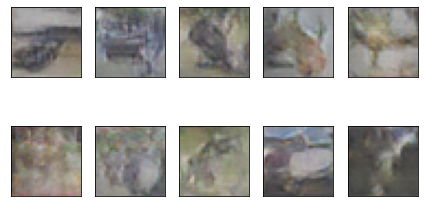

Time for epoch 181 is 60.750192642211914 sec
epoch = 182/400, d_loss=0.017, g_loss=6.601
Time for epoch 182 is 60.30472660064697 sec
epoch = 183/400, d_loss=0.057, g_loss=3.320
Time for epoch 183 is 60.20412755012512 sec
epoch = 184/400, d_loss=0.021, g_loss=3.536
Time for epoch 184 is 60.58812880516052 sec
epoch = 185/400, d_loss=0.026, g_loss=6.356
Time for epoch 185 is 60.28856348991394 sec
epoch = 186/400, d_loss=0.022, g_loss=3.602


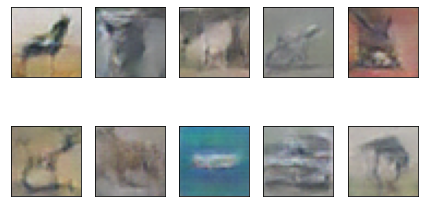

Time for epoch 186 is 60.799312114715576 sec
epoch = 187/400, d_loss=0.089, g_loss=1.910
Time for epoch 187 is 60.198198080062866 sec
epoch = 188/400, d_loss=0.145, g_loss=9.639
Time for epoch 188 is 60.38592982292175 sec
epoch = 189/400, d_loss=0.068, g_loss=5.146
Time for epoch 189 is 60.86842179298401 sec
epoch = 190/400, d_loss=0.030, g_loss=9.788
Time for epoch 190 is 60.33647131919861 sec
epoch = 191/400, d_loss=0.202, g_loss=6.339


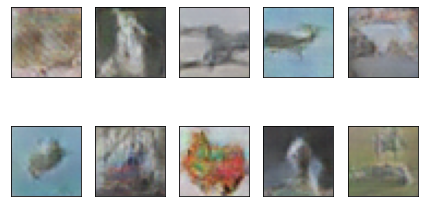

Time for epoch 191 is 60.68184447288513 sec
epoch = 192/400, d_loss=0.688, g_loss=6.068
Time for epoch 192 is 60.28123140335083 sec
epoch = 193/400, d_loss=0.068, g_loss=7.191
Time for epoch 193 is 60.50820589065552 sec
epoch = 194/400, d_loss=0.087, g_loss=6.083
Time for epoch 194 is 60.72921633720398 sec
epoch = 195/400, d_loss=0.033, g_loss=4.572
Time for epoch 195 is 60.49591016769409 sec
epoch = 196/400, d_loss=0.846, g_loss=4.670


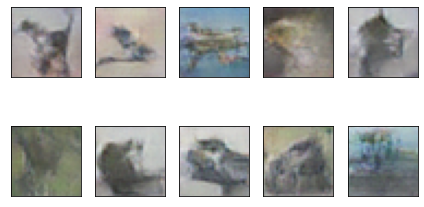

Time for epoch 196 is 60.76674938201904 sec
epoch = 197/400, d_loss=0.010, g_loss=6.801
Time for epoch 197 is 60.27615451812744 sec
epoch = 198/400, d_loss=0.038, g_loss=6.998
Time for epoch 198 is 60.3037166595459 sec
epoch = 199/400, d_loss=1.227, g_loss=0.491
Time for epoch 199 is 60.71683955192566 sec
epoch = 200/400, d_loss=0.002, g_loss=11.455
Time for epoch 200 is 60.37989926338196 sec
epoch = 201/400, d_loss=0.038, g_loss=5.752


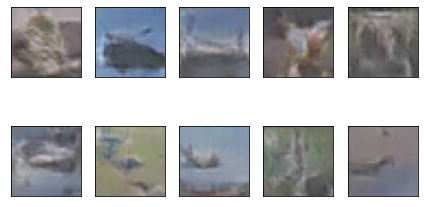

Time for epoch 201 is 60.78436827659607 sec
epoch = 202/400, d_loss=0.036, g_loss=5.484
Time for epoch 202 is 60.37707448005676 sec
epoch = 203/400, d_loss=0.102, g_loss=6.159
Time for epoch 203 is 60.32907176017761 sec
epoch = 204/400, d_loss=1.723, g_loss=1.507
Time for epoch 204 is 60.67745494842529 sec
epoch = 205/400, d_loss=0.020, g_loss=3.609
Time for epoch 205 is 60.1130952835083 sec
epoch = 206/400, d_loss=0.008, g_loss=12.688


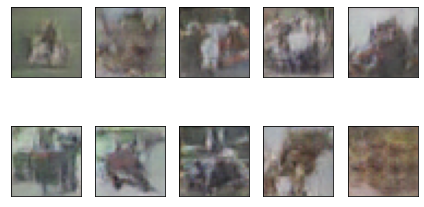

Time for epoch 206 is 60.9270179271698 sec
epoch = 207/400, d_loss=0.268, g_loss=2.291
Time for epoch 207 is 60.44305372238159 sec
epoch = 208/400, d_loss=0.716, g_loss=4.659
Time for epoch 208 is 60.72206115722656 sec
epoch = 209/400, d_loss=0.009, g_loss=6.388
Time for epoch 209 is 60.897071838378906 sec
epoch = 210/400, d_loss=0.309, g_loss=9.344
Time for epoch 210 is 60.33288550376892 sec
epoch = 211/400, d_loss=0.033, g_loss=3.827


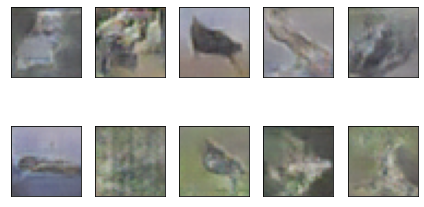

Time for epoch 211 is 60.95624589920044 sec
epoch = 212/400, d_loss=0.453, g_loss=4.288
Time for epoch 212 is 60.57782220840454 sec
epoch = 213/400, d_loss=0.011, g_loss=4.805
Time for epoch 213 is 60.52217102050781 sec
epoch = 214/400, d_loss=0.026, g_loss=5.092
Time for epoch 214 is 60.61615824699402 sec
epoch = 215/400, d_loss=0.194, g_loss=4.624
Time for epoch 215 is 60.6387255191803 sec
epoch = 216/400, d_loss=0.030, g_loss=3.419


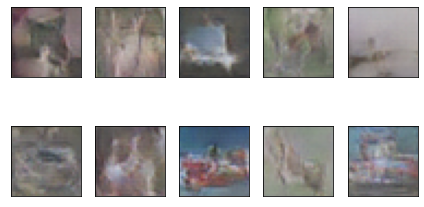

Time for epoch 216 is 61.057997703552246 sec
epoch = 217/400, d_loss=0.079, g_loss=6.750
Time for epoch 217 is 60.745473861694336 sec
epoch = 218/400, d_loss=0.003, g_loss=7.220
Time for epoch 218 is 60.31838297843933 sec
epoch = 219/400, d_loss=0.044, g_loss=3.546
Time for epoch 219 is 60.39621353149414 sec
epoch = 220/400, d_loss=0.008, g_loss=5.887
Time for epoch 220 is 61.244154930114746 sec
epoch = 221/400, d_loss=0.010, g_loss=5.937


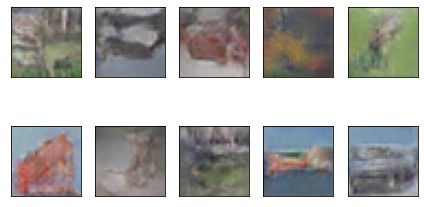

Time for epoch 221 is 61.07393789291382 sec
epoch = 222/400, d_loss=0.099, g_loss=6.929
Time for epoch 222 is 60.6303813457489 sec
epoch = 223/400, d_loss=0.140, g_loss=4.563
Time for epoch 223 is 60.79156970977783 sec
epoch = 224/400, d_loss=0.013, g_loss=5.236
Time for epoch 224 is 60.52796387672424 sec
epoch = 225/400, d_loss=0.010, g_loss=4.534
Time for epoch 225 is 60.989213943481445 sec
epoch = 226/400, d_loss=0.002, g_loss=5.639


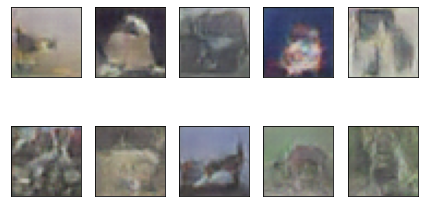

Time for epoch 226 is 61.02535891532898 sec
epoch = 227/400, d_loss=0.121, g_loss=3.671
Time for epoch 227 is 60.60084104537964 sec
epoch = 228/400, d_loss=0.004, g_loss=3.422
Time for epoch 228 is 60.785773038864136 sec
epoch = 229/400, d_loss=0.018, g_loss=4.853
Time for epoch 229 is 60.3471622467041 sec
epoch = 230/400, d_loss=0.476, g_loss=5.103
Time for epoch 230 is 60.6522696018219 sec
epoch = 231/400, d_loss=0.015, g_loss=3.107


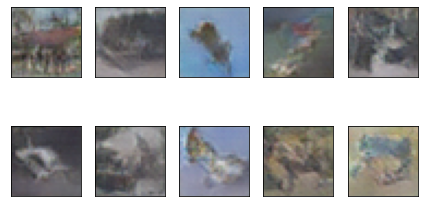

Time for epoch 231 is 61.00471329689026 sec
epoch = 232/400, d_loss=0.011, g_loss=7.136
Time for epoch 232 is 60.625444173812866 sec
epoch = 233/400, d_loss=0.045, g_loss=7.211
Time for epoch 233 is 60.68502736091614 sec
epoch = 234/400, d_loss=0.102, g_loss=8.384
Time for epoch 234 is 60.19214987754822 sec
epoch = 235/400, d_loss=0.208, g_loss=2.161
Time for epoch 235 is 60.80793333053589 sec
epoch = 236/400, d_loss=0.001, g_loss=8.211


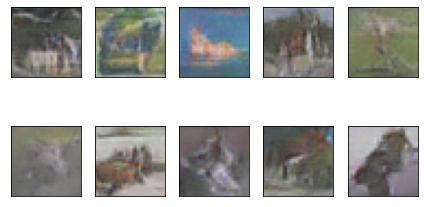

Time for epoch 236 is 60.93761467933655 sec
epoch = 237/400, d_loss=0.044, g_loss=8.506
Time for epoch 237 is 60.282461643218994 sec
epoch = 238/400, d_loss=0.034, g_loss=6.230
Time for epoch 238 is 60.2713987827301 sec
epoch = 239/400, d_loss=0.031, g_loss=5.189
Time for epoch 239 is 60.320061445236206 sec
epoch = 240/400, d_loss=0.006, g_loss=4.382
Time for epoch 240 is 60.6648473739624 sec
epoch = 241/400, d_loss=0.070, g_loss=7.077


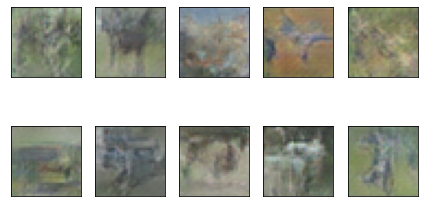

Time for epoch 241 is 61.01213002204895 sec
epoch = 242/400, d_loss=0.008, g_loss=10.528
Time for epoch 242 is 60.53317975997925 sec
epoch = 243/400, d_loss=0.016, g_loss=2.201
Time for epoch 243 is 60.486778020858765 sec
epoch = 244/400, d_loss=0.083, g_loss=4.640
Time for epoch 244 is 60.62300753593445 sec
epoch = 245/400, d_loss=0.213, g_loss=7.956
Time for epoch 245 is 60.68051886558533 sec
epoch = 246/400, d_loss=0.555, g_loss=6.809


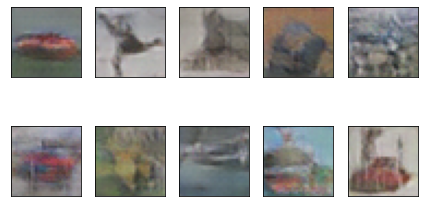

Time for epoch 246 is 60.868377685546875 sec
epoch = 247/400, d_loss=0.042, g_loss=2.374
Time for epoch 247 is 60.45733618736267 sec
epoch = 248/400, d_loss=0.008, g_loss=7.209
Time for epoch 248 is 60.479602575302124 sec
epoch = 249/400, d_loss=0.012, g_loss=4.341
Time for epoch 249 is 60.16996121406555 sec
epoch = 250/400, d_loss=0.011, g_loss=9.372
Time for epoch 250 is 60.51253628730774 sec
epoch = 251/400, d_loss=0.013, g_loss=6.943


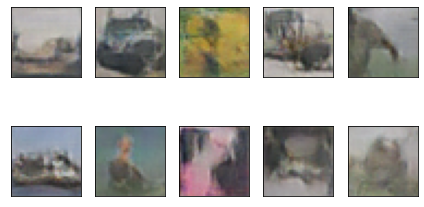

Time for epoch 251 is 60.74855637550354 sec
epoch = 252/400, d_loss=0.164, g_loss=3.172
Time for epoch 252 is 60.419681549072266 sec
epoch = 253/400, d_loss=0.039, g_loss=6.631
Time for epoch 253 is 60.32555317878723 sec
epoch = 254/400, d_loss=0.291, g_loss=4.074
Time for epoch 254 is 60.23904323577881 sec
epoch = 255/400, d_loss=0.209, g_loss=0.263
Time for epoch 255 is 60.0803759098053 sec
epoch = 256/400, d_loss=0.077, g_loss=5.836


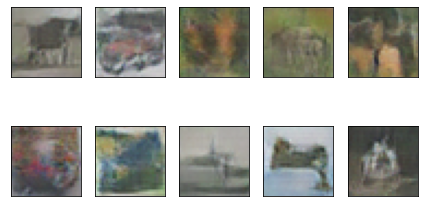

Time for epoch 256 is 61.40284776687622 sec
epoch = 257/400, d_loss=0.020, g_loss=7.773
Time for epoch 257 is 60.13290309906006 sec
epoch = 258/400, d_loss=0.028, g_loss=2.591
Time for epoch 258 is 60.47715735435486 sec
epoch = 259/400, d_loss=0.076, g_loss=4.796
Time for epoch 259 is 60.03019118309021 sec
epoch = 260/400, d_loss=0.162, g_loss=5.998
Time for epoch 260 is 60.16223454475403 sec
epoch = 261/400, d_loss=0.005, g_loss=4.172


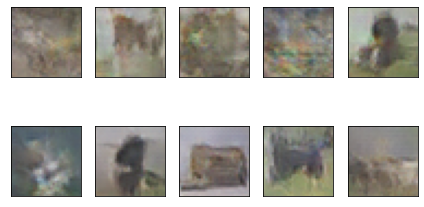

Time for epoch 261 is 61.02896285057068 sec
epoch = 262/400, d_loss=0.037, g_loss=4.503
Time for epoch 262 is 59.91309833526611 sec
epoch = 263/400, d_loss=0.022, g_loss=8.658
Time for epoch 263 is 60.39211106300354 sec
epoch = 264/400, d_loss=0.097, g_loss=4.798
Time for epoch 264 is 59.99889922142029 sec
epoch = 265/400, d_loss=0.024, g_loss=4.377
Time for epoch 265 is 59.964842796325684 sec
epoch = 266/400, d_loss=0.013, g_loss=4.315


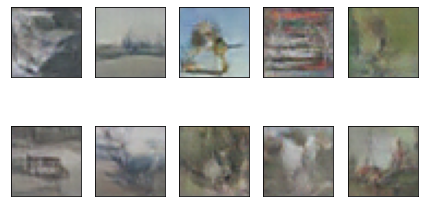

Time for epoch 266 is 60.94280433654785 sec
epoch = 267/400, d_loss=0.002, g_loss=3.728
Time for epoch 267 is 60.38691806793213 sec
epoch = 268/400, d_loss=0.016, g_loss=7.866
Time for epoch 268 is 60.57578706741333 sec
epoch = 269/400, d_loss=0.012, g_loss=3.053
Time for epoch 269 is 60.26364183425903 sec
epoch = 270/400, d_loss=0.091, g_loss=5.033
Time for epoch 270 is 60.24015259742737 sec
epoch = 271/400, d_loss=0.373, g_loss=7.354


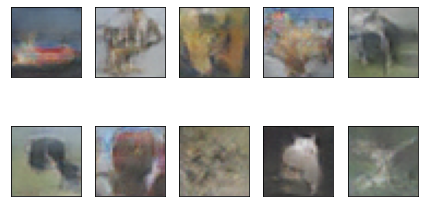

Time for epoch 271 is 61.26098012924194 sec
epoch = 272/400, d_loss=0.212, g_loss=2.812
Time for epoch 272 is 60.09694266319275 sec
epoch = 273/400, d_loss=0.030, g_loss=0.981
Time for epoch 273 is 60.52073383331299 sec
epoch = 274/400, d_loss=0.377, g_loss=5.810
Time for epoch 274 is 60.07372307777405 sec
epoch = 275/400, d_loss=0.047, g_loss=5.277
Time for epoch 275 is 59.87794780731201 sec
epoch = 276/400, d_loss=0.016, g_loss=6.488


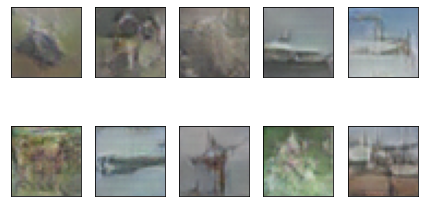

Time for epoch 276 is 60.945232629776 sec
epoch = 277/400, d_loss=0.015, g_loss=8.078
Time for epoch 277 is 60.362202644348145 sec
epoch = 278/400, d_loss=0.008, g_loss=5.050
Time for epoch 278 is 60.44051146507263 sec
epoch = 279/400, d_loss=0.009, g_loss=4.807
Time for epoch 279 is 60.345988035202026 sec
epoch = 280/400, d_loss=0.097, g_loss=1.705
Time for epoch 280 is 60.27074956893921 sec
epoch = 281/400, d_loss=0.020, g_loss=7.043


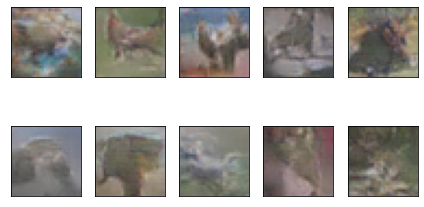

Time for epoch 281 is 61.22026515007019 sec
epoch = 282/400, d_loss=0.077, g_loss=9.144
Time for epoch 282 is 60.31398057937622 sec
epoch = 283/400, d_loss=0.029, g_loss=4.706
Time for epoch 283 is 60.44929814338684 sec
epoch = 284/400, d_loss=0.003, g_loss=4.800
Time for epoch 284 is 60.45016145706177 sec
epoch = 285/400, d_loss=0.011, g_loss=5.366
Time for epoch 285 is 60.44217252731323 sec
epoch = 286/400, d_loss=0.621, g_loss=5.707


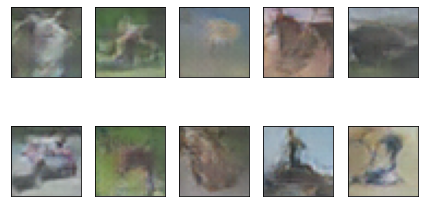

Time for epoch 286 is 61.29514193534851 sec
epoch = 287/400, d_loss=0.204, g_loss=3.114
Time for epoch 287 is 60.2374370098114 sec
epoch = 288/400, d_loss=0.033, g_loss=7.845
Time for epoch 288 is 60.263447761535645 sec
epoch = 289/400, d_loss=0.004, g_loss=5.339
Time for epoch 289 is 60.331255197525024 sec
epoch = 290/400, d_loss=0.008, g_loss=5.330
Time for epoch 290 is 60.197407722473145 sec
epoch = 291/400, d_loss=0.004, g_loss=6.695


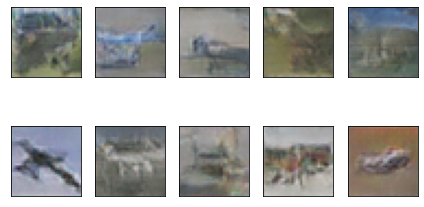

Time for epoch 291 is 60.90188527107239 sec
epoch = 292/400, d_loss=0.039, g_loss=6.808
Time for epoch 292 is 60.88939094543457 sec
epoch = 293/400, d_loss=0.017, g_loss=6.974
Time for epoch 293 is 60.249619483947754 sec
epoch = 294/400, d_loss=0.122, g_loss=4.355
Time for epoch 294 is 60.64408206939697 sec
epoch = 295/400, d_loss=0.023, g_loss=4.526
Time for epoch 295 is 60.193214654922485 sec
epoch = 296/400, d_loss=0.004, g_loss=7.662


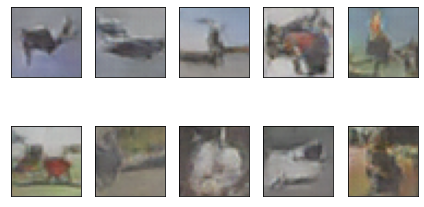

Time for epoch 296 is 61.03359937667847 sec
epoch = 297/400, d_loss=0.002, g_loss=5.290
Time for epoch 297 is 60.87418985366821 sec
epoch = 298/400, d_loss=0.054, g_loss=11.176
Time for epoch 298 is 60.20367169380188 sec
epoch = 299/400, d_loss=0.997, g_loss=2.635
Time for epoch 299 is 60.67270588874817 sec
epoch = 300/400, d_loss=0.025, g_loss=7.835
Time for epoch 300 is 60.166197299957275 sec
epoch = 301/400, d_loss=0.045, g_loss=6.982


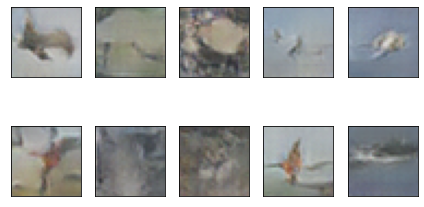

Time for epoch 301 is 60.52189493179321 sec
epoch = 302/400, d_loss=0.022, g_loss=2.907
Time for epoch 302 is 60.89697551727295 sec
epoch = 303/400, d_loss=0.018, g_loss=5.676
Time for epoch 303 is 60.21998691558838 sec
epoch = 304/400, d_loss=0.020, g_loss=5.458
Time for epoch 304 is 60.445998668670654 sec
epoch = 305/400, d_loss=0.002, g_loss=8.226
Time for epoch 305 is 60.34057569503784 sec
epoch = 306/400, d_loss=0.065, g_loss=7.880


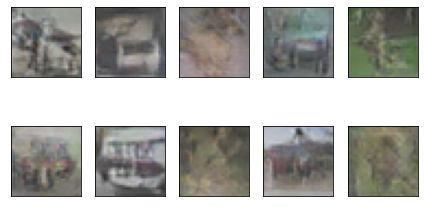

Time for epoch 306 is 60.829686403274536 sec
epoch = 307/400, d_loss=0.001, g_loss=3.756
Time for epoch 307 is 60.85335397720337 sec
epoch = 308/400, d_loss=0.053, g_loss=6.159
Time for epoch 308 is 60.28379964828491 sec
epoch = 309/400, d_loss=0.169, g_loss=6.050
Time for epoch 309 is 60.531574964523315 sec
epoch = 310/400, d_loss=0.184, g_loss=1.237
Time for epoch 310 is 60.35205149650574 sec
epoch = 311/400, d_loss=0.007, g_loss=6.183


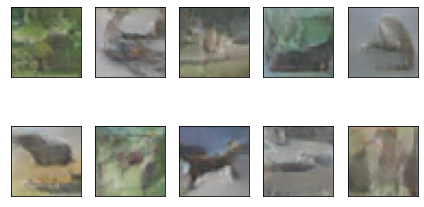

Time for epoch 311 is 60.61441731452942 sec
epoch = 312/400, d_loss=0.008, g_loss=5.069
Time for epoch 312 is 61.07436943054199 sec
epoch = 313/400, d_loss=0.066, g_loss=3.339
Time for epoch 313 is 60.24904155731201 sec
epoch = 314/400, d_loss=0.015, g_loss=6.560
Time for epoch 314 is 60.419002056121826 sec
epoch = 315/400, d_loss=1.468, g_loss=10.240
Time for epoch 315 is 60.264084815979004 sec
epoch = 316/400, d_loss=0.004, g_loss=6.275


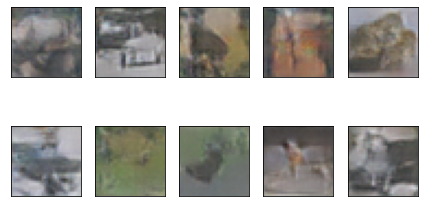

Time for epoch 316 is 60.838847398757935 sec
epoch = 317/400, d_loss=0.013, g_loss=3.545
Time for epoch 317 is 60.90685796737671 sec
epoch = 318/400, d_loss=0.014, g_loss=5.818
Time for epoch 318 is 59.971524238586426 sec
epoch = 319/400, d_loss=0.015, g_loss=6.272
Time for epoch 319 is 60.217395067214966 sec
epoch = 320/400, d_loss=0.001, g_loss=8.130
Time for epoch 320 is 60.088149070739746 sec
epoch = 321/400, d_loss=0.005, g_loss=6.507


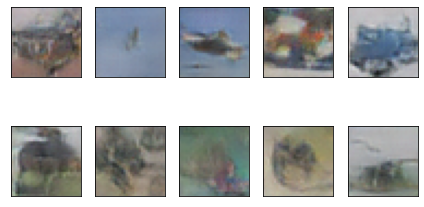

Time for epoch 321 is 60.72507190704346 sec
epoch = 322/400, d_loss=0.032, g_loss=3.249
Time for epoch 322 is 60.406816244125366 sec
epoch = 323/400, d_loss=0.097, g_loss=5.086
Time for epoch 323 is 60.188952684402466 sec
epoch = 324/400, d_loss=0.018, g_loss=4.775
Time for epoch 324 is 60.61297106742859 sec
epoch = 325/400, d_loss=0.353, g_loss=0.993
Time for epoch 325 is 60.395954608917236 sec
epoch = 326/400, d_loss=0.079, g_loss=4.448


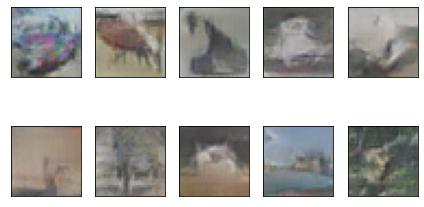

Time for epoch 326 is 60.83808159828186 sec
epoch = 327/400, d_loss=0.950, g_loss=6.965
Time for epoch 327 is 60.63437557220459 sec
epoch = 328/400, d_loss=0.010, g_loss=8.209
Time for epoch 328 is 60.66489338874817 sec
epoch = 329/400, d_loss=0.001, g_loss=7.503
Time for epoch 329 is 60.42644190788269 sec
epoch = 330/400, d_loss=0.111, g_loss=3.292
Time for epoch 330 is 60.36341834068298 sec
epoch = 331/400, d_loss=0.107, g_loss=3.284


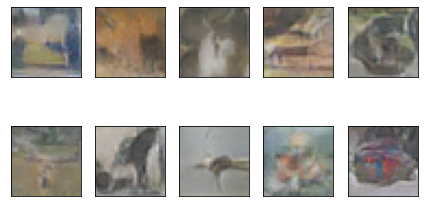

Time for epoch 331 is 60.71767044067383 sec
epoch = 332/400, d_loss=0.007, g_loss=7.415
Time for epoch 332 is 60.4507532119751 sec
epoch = 333/400, d_loss=0.001, g_loss=7.047
Time for epoch 333 is 60.86875867843628 sec
epoch = 334/400, d_loss=0.346, g_loss=2.985
Time for epoch 334 is 60.495150566101074 sec
epoch = 335/400, d_loss=0.069, g_loss=6.346
Time for epoch 335 is 60.309781312942505 sec
epoch = 336/400, d_loss=0.126, g_loss=6.864


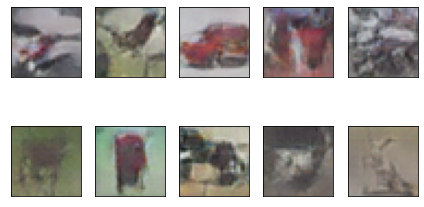

Time for epoch 336 is 61.403539180755615 sec
epoch = 337/400, d_loss=0.067, g_loss=6.568
Time for epoch 337 is 60.45024490356445 sec
epoch = 338/400, d_loss=0.001, g_loss=8.418
Time for epoch 338 is 60.90592551231384 sec
epoch = 339/400, d_loss=0.011, g_loss=10.257
Time for epoch 339 is 60.61156225204468 sec
epoch = 340/400, d_loss=0.026, g_loss=4.695
Time for epoch 340 is 60.668612241744995 sec
epoch = 341/400, d_loss=0.104, g_loss=2.332


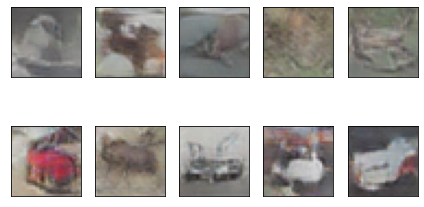

Time for epoch 341 is 60.87224006652832 sec
epoch = 342/400, d_loss=0.060, g_loss=8.450
Time for epoch 342 is 60.34749698638916 sec
epoch = 343/400, d_loss=0.001, g_loss=8.705
Time for epoch 343 is 61.124600648880005 sec
epoch = 344/400, d_loss=0.134, g_loss=11.197
Time for epoch 344 is 60.71331739425659 sec
epoch = 345/400, d_loss=0.078, g_loss=5.527
Time for epoch 345 is 60.37970519065857 sec
epoch = 346/400, d_loss=0.009, g_loss=8.288


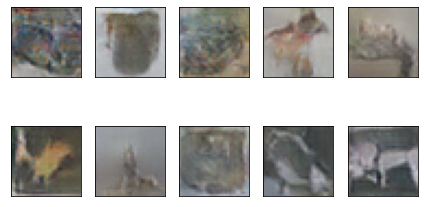

Time for epoch 346 is 61.09650635719299 sec
epoch = 347/400, d_loss=0.003, g_loss=4.425
Time for epoch 347 is 60.00808668136597 sec
epoch = 348/400, d_loss=0.018, g_loss=3.808
Time for epoch 348 is 60.73928236961365 sec
epoch = 349/400, d_loss=0.006, g_loss=5.974
Time for epoch 349 is 60.43793320655823 sec
epoch = 350/400, d_loss=0.208, g_loss=8.449
Time for epoch 350 is 60.21334743499756 sec
epoch = 351/400, d_loss=0.126, g_loss=6.982


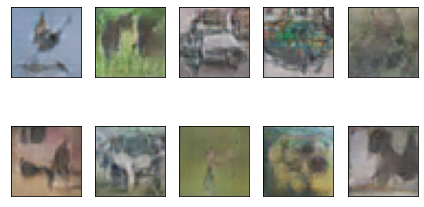

Time for epoch 351 is 60.83741331100464 sec
epoch = 352/400, d_loss=0.258, g_loss=8.537
Time for epoch 352 is 60.36402606964111 sec
epoch = 353/400, d_loss=0.219, g_loss=4.653
Time for epoch 353 is 60.93427872657776 sec
epoch = 354/400, d_loss=0.064, g_loss=6.546
Time for epoch 354 is 60.633450984954834 sec
epoch = 355/400, d_loss=0.036, g_loss=5.312
Time for epoch 355 is 60.37760591506958 sec
epoch = 356/400, d_loss=0.010, g_loss=7.288


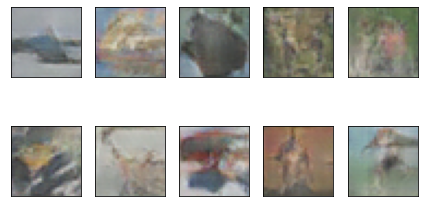

Time for epoch 356 is 60.892412424087524 sec
epoch = 357/400, d_loss=0.005, g_loss=6.310
Time for epoch 357 is 60.27448773384094 sec
epoch = 358/400, d_loss=0.040, g_loss=2.055
Time for epoch 358 is 60.74527025222778 sec
epoch = 359/400, d_loss=0.552, g_loss=7.388
Time for epoch 359 is 60.47592830657959 sec
epoch = 360/400, d_loss=0.128, g_loss=0.310
Time for epoch 360 is 60.38218283653259 sec
epoch = 361/400, d_loss=0.006, g_loss=6.410


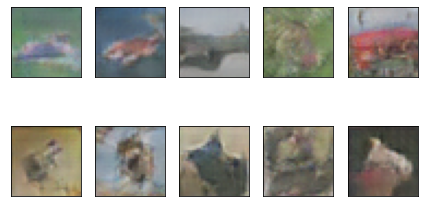

Time for epoch 361 is 60.86167621612549 sec
epoch = 362/400, d_loss=0.010, g_loss=4.114
Time for epoch 362 is 60.24737501144409 sec
epoch = 363/400, d_loss=0.037, g_loss=6.012
Time for epoch 363 is 60.642739057540894 sec
epoch = 364/400, d_loss=0.006, g_loss=7.162
Time for epoch 364 is 60.72811961174011 sec
epoch = 365/400, d_loss=0.002, g_loss=6.757
Time for epoch 365 is 60.17961812019348 sec
epoch = 366/400, d_loss=0.004, g_loss=6.363


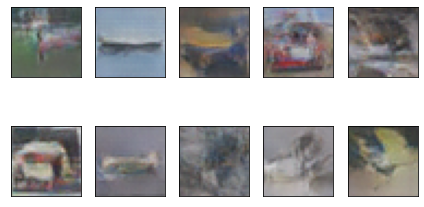

Time for epoch 366 is 60.831300258636475 sec
epoch = 367/400, d_loss=0.191, g_loss=3.034
Time for epoch 367 is 59.80468797683716 sec
epoch = 368/400, d_loss=0.125, g_loss=12.338
Time for epoch 368 is 59.81327486038208 sec
epoch = 369/400, d_loss=0.184, g_loss=2.498
Time for epoch 369 is 60.31093788146973 sec
epoch = 370/400, d_loss=0.063, g_loss=5.157
Time for epoch 370 is 59.48829889297485 sec
epoch = 371/400, d_loss=0.011, g_loss=5.784


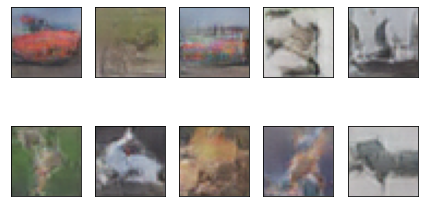

Time for epoch 371 is 59.97778797149658 sec
epoch = 372/400, d_loss=0.100, g_loss=3.867
Time for epoch 372 is 59.6552836894989 sec
epoch = 373/400, d_loss=0.016, g_loss=7.390
Time for epoch 373 is 59.410950899124146 sec
epoch = 374/400, d_loss=0.013, g_loss=7.734
Time for epoch 374 is 60.07069706916809 sec
epoch = 375/400, d_loss=0.122, g_loss=1.731
Time for epoch 375 is 59.35747981071472 sec
epoch = 376/400, d_loss=0.128, g_loss=5.928


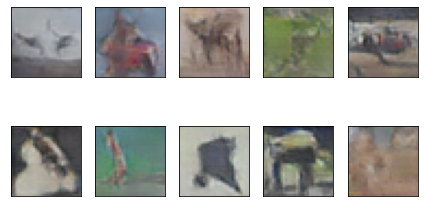

Time for epoch 376 is 60.07019829750061 sec
epoch = 377/400, d_loss=0.039, g_loss=6.206
Time for epoch 377 is 60.03083324432373 sec
epoch = 378/400, d_loss=0.065, g_loss=0.456
Time for epoch 378 is 60.129655838012695 sec
epoch = 379/400, d_loss=0.047, g_loss=7.914
Time for epoch 379 is 60.867982387542725 sec
epoch = 380/400, d_loss=0.501, g_loss=3.783
Time for epoch 380 is 60.54399752616882 sec
epoch = 381/400, d_loss=0.014, g_loss=7.898


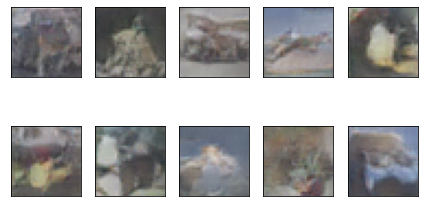

Time for epoch 381 is 60.57520818710327 sec
epoch = 382/400, d_loss=0.085, g_loss=5.486
Time for epoch 382 is 60.62439823150635 sec
epoch = 383/400, d_loss=0.222, g_loss=2.380
Time for epoch 383 is 60.353270053863525 sec
epoch = 384/400, d_loss=0.001, g_loss=5.067
Time for epoch 384 is 60.843528032302856 sec
epoch = 385/400, d_loss=0.030, g_loss=5.619
Time for epoch 385 is 60.405882835388184 sec
epoch = 386/400, d_loss=0.029, g_loss=3.715


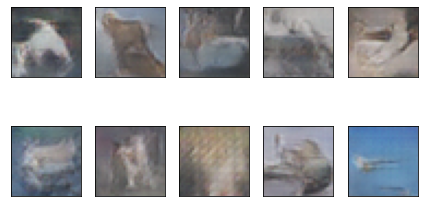

Time for epoch 386 is 60.617281675338745 sec
epoch = 387/400, d_loss=0.010, g_loss=5.276
Time for epoch 387 is 60.04573678970337 sec
epoch = 388/400, d_loss=0.005, g_loss=3.466
Time for epoch 388 is 60.06616950035095 sec
epoch = 389/400, d_loss=0.260, g_loss=4.197
Time for epoch 389 is 60.63393497467041 sec
epoch = 390/400, d_loss=0.100, g_loss=4.285
Time for epoch 390 is 60.36283206939697 sec
epoch = 391/400, d_loss=0.011, g_loss=5.542


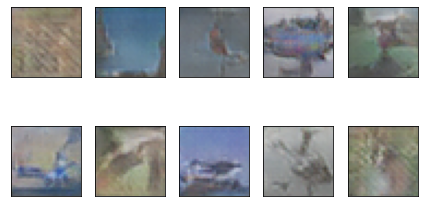

Time for epoch 391 is 60.51243281364441 sec
epoch = 392/400, d_loss=0.191, g_loss=6.740
Time for epoch 392 is 60.36735725402832 sec
epoch = 393/400, d_loss=0.010, g_loss=2.535
Time for epoch 393 is 60.21400785446167 sec
epoch = 394/400, d_loss=1.166, g_loss=2.879
Time for epoch 394 is 60.87735104560852 sec
epoch = 395/400, d_loss=0.033, g_loss=3.497
Time for epoch 395 is 60.48633122444153 sec
epoch = 396/400, d_loss=0.041, g_loss=3.639


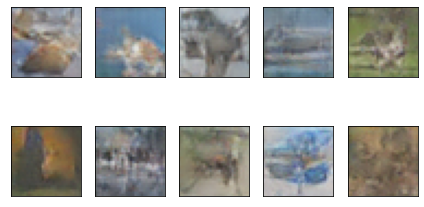

Time for epoch 396 is 61.01456427574158 sec
epoch = 397/400, d_loss=0.809, g_loss=6.074
Time for epoch 397 is 60.673787355422974 sec
epoch = 398/400, d_loss=0.272, g_loss=3.087
Time for epoch 398 is 60.446282625198364 sec
epoch = 399/400, d_loss=0.019, g_loss=6.688
Time for epoch 399 is 60.657647132873535 sec
epoch = 400/400, d_loss=0.023, g_loss=5.266
Time for epoch 400 is 61.06755256652832 sec
x_test2: 10000
Learning rate: 0.0045
Epoch 1/200


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  



Model saved in cifar.hdf5
Learning rate: 0.00405
Epoch 2/200



Model saved in cifar.hdf5
Learning rate: 0.003645
Epoch 3/200



Model saved in cifar.hdf5
Learning rate: 0.0032805
Epoch 4/200



Model saved in cifar.hdf5
Learning rate: 0.00295245
Epoch 5/200



Model saved in cifar.hdf5
Learning rate: 0.002657205
Epoch 6/200



Model saved in cifar.hdf5
Learning rate: 0.0023914846
Epoch 7/200



Model saved in cifar.hdf5
Learning rate: 0.002152336
Epoch 8/200



Model saved in cifar.hdf5
Learning rate: 0.0019371024
Epoch 9/200



Model saved in cifar.hdf5
Learning rate: 0.0017433922
Epoch 10/200



Model saved in cifar.hdf5
Learning rate: 0.0015690529
Epoch 11/200



Model saved in cifar.hdf5
Learning rate: 0.0014121477
Epoch 12/200



Model saved in cifar.hdf5
Learning rate: 0.001270933
Epoch 13/200



Model saved in cifar.hdf5
Learning rate: 0.0011438397
Epoch 14/200



Model saved in cifar.hdf5
Learning rate: 0.0010294557
Epoch 15/200



Model saved in cifar.hdf5
Learning rate: 0.0009265101
Epoch 16/200



Model saved in cifar.hdf5
Learning rate: 0.0008338591
Epoch 17/200



Model saved in cifar.hdf5
Learning rate: 0.0007504732
Epoch 18/200



Model saved in cifar.hdf5
Learning rate: 0.00067542586
Epoch 19/200



Model saved in cifar.hdf5
Learning rate: 0.00060788327
Epoch 20/200



Model saved in cifar.hdf5
Learning rate: 0.00054709497
Epoch 21/200



Model saved in cifar.hdf5
Learning rate: 0.0004923855
Epoch 22/200



Model saved in cifar.hdf5
Learning rate: 0.0004431469
Epoch 23/200



Model saved in cifar.hdf5
Learning rate: 0.00039883223
Epoch 24/200



Model saved in cifar.hdf5
Learning rate: 0.000358949
Epoch 25/200



Model saved in cifar.hdf5
Learning rate: 0.0003230541
Epoch 26/200



Model saved in cifar.hdf5
Learning rate: 0.0002907487
Epoch 27/200



Model saved in cifar.hdf5
Learning rate: 0.00026167382
Epoch 28/200



Model saved in cifar.hdf5
Learning rate: 0.00023550644
Epoch 29/200



Model saved in cifar.hdf5
Learning rate: 0.00021195579
Epoch 30/200



Model saved in cifar.hdf5
Learning rate: 0.00019076021
Epoch 31/200



Model saved in cifar.hdf5
Learning rate: 0.0001716842
Epoch 32/200



Model saved in cifar.hdf5
Learning rate: 0.00015451577
Epoch 33/200



Model saved in cifar.hdf5
Learning rate: 0.0001390642
Epoch 34/200



Model saved in cifar.hdf5
Learning rate: 0.00012515778
Epoch 35/200



Model saved in cifar.hdf5
Learning rate: 0.000112641996
Epoch 36/200



Model saved in cifar.hdf5
Learning rate: 0.000101377795
Epoch 37/200



Model saved in cifar.hdf5
Learning rate: 9.124002e-05
Epoch 38/200



Model saved in cifar.hdf5
Learning rate: 8.2116014e-05
Epoch 39/200



Model saved in cifar.hdf5
Learning rate: 7.390441e-05
Epoch 40/200



Model saved in cifar.hdf5
Learning rate: 6.6513974e-05
Epoch 41/200



Model saved in cifar.hdf5
Learning rate: 5.9862577e-05
Epoch 42/200



Model saved in cifar.hdf5
Learning rate: 5.387632e-05
Epoch 43/200



Model saved in cifar.hdf5
Learning rate: 4.8488688e-05
Epoch 44/200



Model saved in cifar.hdf5
Learning rate: 4.363982e-05
Epoch 45/200



Model saved in cifar.hdf5
Learning rate: 3.9275837e-05
Epoch 46/200



Model saved in cifar.hdf5
Learning rate: 3.5348254e-05
Epoch 47/200



Model saved in cifar.hdf5
Learning rate: 3.1813426e-05
Epoch 48/200



Model saved in cifar.hdf5
Learning rate: 2.8632085e-05
Epoch 49/200



Model saved in cifar.hdf5
Learning rate: 2.5768875e-05
Epoch 50/200



Model saved in cifar.hdf5
Learning rate: 2.3191988e-05
Epoch 51/200



Model saved in cifar.hdf5
Learning rate: 2.0872789e-05
Epoch 52/200



Model saved in cifar.hdf5
Learning rate: 1.8785511e-05
Epoch 53/200



Model saved in cifar.hdf5
Learning rate: 1.6906959e-05
Epoch 54/200



Model saved in cifar.hdf5
Learning rate: 1.5216264e-05
Epoch 55/200



Model saved in cifar.hdf5
Learning rate: 1.3694637e-05
Epoch 56/200



Model saved in cifar.hdf5
Learning rate: 1.2325174e-05
Epoch 57/200



Model saved in cifar.hdf5
Learning rate: 1.1092656e-05
Epoch 58/200



Model saved in cifar.hdf5
Learning rate: 9.983391e-06
Epoch 59/200



Model saved in cifar.hdf5
Learning rate: 8.985052e-06
Epoch 60/200



Model saved in cifar.hdf5
Learning rate: 8.086547e-06
Epoch 61/200



Model saved in cifar.hdf5
Learning rate: 7.2778917e-06
Epoch 62/200



Model saved in cifar.hdf5
Learning rate: 6.5501026e-06
Epoch 63/200



Model saved in cifar.hdf5
Learning rate: 5.8950923e-06
Epoch 64/200



Model saved in cifar.hdf5
Learning rate: 5.3055833e-06
Epoch 65/200



Model saved in cifar.hdf5
Learning rate: 4.7750245e-06
Epoch 66/200



Model saved in cifar.hdf5
Learning rate: 4.297522e-06
Epoch 67/200



Model saved in cifar.hdf5
Learning rate: 3.86777e-06
Epoch 68/200



Model saved in cifar.hdf5
Learning rate: 3.480993e-06
Epoch 69/200



Model saved in cifar.hdf5
Learning rate: 3.1328937e-06
Epoch 70/200



Model saved in cifar.hdf5
Learning rate: 2.8196043e-06
Epoch 71/200



Model saved in cifar.hdf5
Learning rate: 2.537644e-06
Epoch 72/200



Model saved in cifar.hdf5
Learning rate: 2.2838794e-06
Epoch 73/200



Model saved in cifar.hdf5
Learning rate: 2.0554917e-06
Epoch 74/200



Model saved in cifar.hdf5
Learning rate: 1.8499425e-06
Epoch 75/200



Model saved in cifar.hdf5
Learning rate: 1.6649482e-06
Epoch 76/200



Model saved in cifar.hdf5
Learning rate: 1.4984533e-06
Epoch 77/200



Model saved in cifar.hdf5
Learning rate: 1.3486081e-06
Epoch 78/200



Model saved in cifar.hdf5
Learning rate: 1.2137472e-06
Epoch 79/200



Model saved in cifar.hdf5
Learning rate: 1.0923725e-06
Epoch 80/200



Model saved in cifar.hdf5
Learning rate: 9.831352e-07
Epoch 81/200



Model saved in cifar.hdf5
Learning rate: 8.848217e-07
Epoch 82/200



Model saved in cifar.hdf5
Learning rate: 7.963396e-07
Epoch 83/200



Model saved in cifar.hdf5
Learning rate: 7.167056e-07
Epoch 84/200



Model saved in cifar.hdf5
Learning rate: 6.45035e-07
Epoch 85/200



Model saved in cifar.hdf5
Learning rate: 5.8053155e-07
Epoch 86/200



Model saved in cifar.hdf5
Learning rate: 5.224784e-07
Epoch 87/200



Model saved in cifar.hdf5
Learning rate: 4.7023053e-07
Epoch 88/200



Model saved in cifar.hdf5
Learning rate: 4.232075e-07
Epoch 89/200



Model saved in cifar.hdf5
Learning rate: 3.8088675e-07
Epoch 90/200



Model saved in cifar.hdf5
Learning rate: 3.4279807e-07
Epoch 91/200



Model saved in cifar.hdf5
Learning rate: 3.0851825e-07
Epoch 92/200



Model saved in cifar.hdf5
Learning rate: 2.7766643e-07
Epoch 93/200



Model saved in cifar.hdf5
Learning rate: 2.4989978e-07
Epoch 94/200



Model saved in cifar.hdf5
Learning rate: 2.2490981e-07
Epoch 95/200



Model saved in cifar.hdf5
Learning rate: 2.0241883e-07
Epoch 96/200



Model saved in cifar.hdf5
Learning rate: 1.8217695e-07
Epoch 97/200



Model saved in cifar.hdf5
Learning rate: 1.6395926e-07
Epoch 98/200



Model saved in cifar.hdf5
Learning rate: 1.4756333e-07
Epoch 99/200



Model saved in cifar.hdf5
Learning rate: 1.3280699e-07
Epoch 100/200



Model saved in cifar.hdf5
Learning rate: 1.1952629e-07
Epoch 101/200



Model saved in cifar.hdf5
Learning rate: 1.0757366e-07
Epoch 102/200



Model saved in cifar.hdf5
Learning rate: 9.68163e-08
Epoch 103/200



Model saved in cifar.hdf5
Learning rate: 8.7134666e-08
Epoch 104/200



Model saved in cifar.hdf5
Learning rate: 7.84212e-08
Epoch 105/200



Model saved in cifar.hdf5
Learning rate: 7.0579084e-08
Epoch 106/200



Model saved in cifar.hdf5
Learning rate: 6.352117e-08
Epoch 107/200



Model saved in cifar.hdf5
Learning rate: 5.7169057e-08
Epoch 108/200



Model saved in cifar.hdf5
Learning rate: 5.145215e-08
Epoch 109/200



Model saved in cifar.hdf5
Learning rate: 4.6306937e-08
Epoch 110/200



Model saved in cifar.hdf5
Learning rate: 4.167624e-08
Epoch 111/200



Model saved in cifar.hdf5
Learning rate: 3.7508617e-08
Epoch 112/200



Model saved in cifar.hdf5
Learning rate: 3.3757757e-08
Epoch 113/200



Model saved in cifar.hdf5
Learning rate: 3.038198e-08
Epoch 114/200



Model saved in cifar.hdf5
Learning rate: 2.7343782e-08
Epoch 115/200



Model saved in cifar.hdf5
Learning rate: 2.4609404e-08
Epoch 116/200



Model saved in cifar.hdf5
Learning rate: 2.2148464e-08
Epoch 117/200



Model saved in cifar.hdf5
Learning rate: 1.9933617e-08
Epoch 118/200



Model saved in cifar.hdf5
Learning rate: 1.7940256e-08
Epoch 119/200



Model saved in cifar.hdf5
Learning rate: 1.614623e-08
Epoch 120/200



Model saved in cifar.hdf5
Learning rate: 1.4531607e-08
Epoch 121/200



Model saved in cifar.hdf5
Learning rate: 1.3078447e-08
Epoch 122/200



Model saved in cifar.hdf5
Learning rate: 1.1770601e-08
Epoch 123/200



Model saved in cifar.hdf5
Learning rate: 1.0593541e-08
Epoch 124/200



Model saved in cifar.hdf5
Learning rate: 9.534188e-09
Epoch 125/200



Model saved in cifar.hdf5
Learning rate: 8.580769e-09
Epoch 126/200



Model saved in cifar.hdf5
Learning rate: 7.722692e-09
Epoch 127/200



Model saved in cifar.hdf5
Learning rate: 6.9504225e-09
Epoch 128/200



Model saved in cifar.hdf5
Learning rate: 6.25538e-09
Epoch 129/200



Model saved in cifar.hdf5
Learning rate: 5.6298424e-09
Epoch 130/200



Model saved in cifar.hdf5
Learning rate: 5.066858e-09
Epoch 131/200



Model saved in cifar.hdf5
Learning rate: 4.5601722e-09
Epoch 132/200



Model saved in cifar.hdf5
Learning rate: 4.1041552e-09
Epoch 133/200



Model saved in cifar.hdf5
Learning rate: 3.6937395e-09
Epoch 134/200



Model saved in cifar.hdf5
Learning rate: 3.3243657e-09
Epoch 135/200



Model saved in cifar.hdf5
Learning rate: 2.991929e-09
Epoch 136/200



Model saved in cifar.hdf5
Learning rate: 2.692736e-09
Epoch 137/200



Model saved in cifar.hdf5
Learning rate: 2.4234625e-09
Epoch 138/200



Model saved in cifar.hdf5
Learning rate: 2.1811162e-09
Epoch 139/200



Model saved in cifar.hdf5
Learning rate: 1.9630046e-09
Epoch 140/200



Model saved in cifar.hdf5
Learning rate: 1.7667042e-09
Epoch 141/200



Model saved in cifar.hdf5
Learning rate: 1.5900338e-09
Epoch 142/200



Model saved in cifar.hdf5
Learning rate: 1.4310304e-09
Epoch 143/200



Model saved in cifar.hdf5
Learning rate: 1.2879273e-09
Epoch 144/200



Model saved in cifar.hdf5
Learning rate: 1.1591346e-09
Epoch 145/200



Model saved in cifar.hdf5
Learning rate: 1.0432212e-09
Epoch 146/200



Model saved in cifar.hdf5
Learning rate: 9.388991e-10
Epoch 147/200



Model saved in cifar.hdf5
Learning rate: 8.450091e-10
Epoch 148/200



Model saved in cifar.hdf5
Learning rate: 7.605082e-10
Epoch 149/200



Model saved in cifar.hdf5
Learning rate: 6.844574e-10
Epoch 150/200



Model saved in cifar.hdf5
Learning rate: 6.1601163e-10
Epoch 151/200



Model saved in cifar.hdf5
Learning rate: 5.544105e-10
Epoch 152/200



Model saved in cifar.hdf5
Learning rate: 4.989694e-10
Epoch 153/200



Model saved in cifar.hdf5
Learning rate: 4.490725e-10
Epoch 154/200



Model saved in cifar.hdf5
Learning rate: 4.0416526e-10
Epoch 155/200



Model saved in cifar.hdf5
Learning rate: 3.6374873e-10
Epoch 156/200



Model saved in cifar.hdf5
Learning rate: 3.2737385e-10
Epoch 157/200



Model saved in cifar.hdf5
Learning rate: 2.9463645e-10
Epoch 158/200



Model saved in cifar.hdf5
Learning rate: 2.6517283e-10
Epoch 159/200



Model saved in cifar.hdf5
Learning rate: 2.3865554e-10
Epoch 160/200



Model saved in cifar.hdf5
Learning rate: 2.1478998e-10
Epoch 161/200



Model saved in cifar.hdf5
Learning rate: 1.9331098e-10
Epoch 162/200



Model saved in cifar.hdf5
Learning rate: 1.7397989e-10
Epoch 163/200



Model saved in cifar.hdf5
Learning rate: 1.565819e-10
Epoch 164/200



Model saved in cifar.hdf5
Learning rate: 1.409237e-10
Epoch 165/200



Model saved in cifar.hdf5
Learning rate: 1.2683134e-10
Epoch 166/200



Model saved in cifar.hdf5
Learning rate: 1.14148205e-10
Epoch 167/200



Model saved in cifar.hdf5
Learning rate: 1.02733384e-10
Epoch 168/200



Model saved in cifar.hdf5
Learning rate: 9.246005e-11
Epoch 169/200



Model saved in cifar.hdf5
Learning rate: 8.321404e-11
Epoch 170/200



Model saved in cifar.hdf5
Learning rate: 7.4892634e-11
Epoch 171/200



Model saved in cifar.hdf5
Learning rate: 6.7403375e-11
Epoch 172/200



Model saved in cifar.hdf5
Learning rate: 6.066304e-11
Epoch 173/200



Model saved in cifar.hdf5
Learning rate: 5.4596733e-11
Epoch 174/200



Model saved in cifar.hdf5
Learning rate: 4.913706e-11
Epoch 175/200



Model saved in cifar.hdf5
Learning rate: 4.4223354e-11
Epoch 176/200



Model saved in cifar.hdf5
Learning rate: 3.9801017e-11
Epoch 177/200



Model saved in cifar.hdf5
Learning rate: 3.5820916e-11
Epoch 178/200



Model saved in cifar.hdf5
Learning rate: 3.2238823e-11
Epoch 179/200



Model saved in cifar.hdf5
Learning rate: 2.9014941e-11
Epoch 180/200



Model saved in cifar.hdf5
Learning rate: 2.6113448e-11
Epoch 181/200



Model saved in cifar.hdf5
Learning rate: 2.3502103e-11
Epoch 182/200



Model saved in cifar.hdf5
Learning rate: 2.1151893e-11
Epoch 183/200



Model saved in cifar.hdf5
Learning rate: 1.9036703e-11
Epoch 184/200



Model saved in cifar.hdf5
Learning rate: 1.7133033e-11
Epoch 185/200



Model saved in cifar.hdf5
Learning rate: 1.541973e-11
Epoch 186/200



Model saved in cifar.hdf5
Learning rate: 1.3877757e-11
Epoch 187/200



Model saved in cifar.hdf5
Learning rate: 1.2489981e-11
Epoch 188/200



Model saved in cifar.hdf5
Learning rate: 1.1240983e-11
Epoch 189/200



Model saved in cifar.hdf5
Learning rate: 1.0116885e-11
Epoch 190/200



Model saved in cifar.hdf5
Learning rate: 9.105196e-12
Epoch 191/200



Model saved in cifar.hdf5
Learning rate: 8.194677e-12
Epoch 192/200



Model saved in cifar.hdf5
Learning rate: 7.375209e-12
Epoch 193/200



Model saved in cifar.hdf5
Learning rate: 6.637688e-12
Epoch 194/200



Model saved in cifar.hdf5
Learning rate: 5.9739193e-12
Epoch 195/200



Model saved in cifar.hdf5
Learning rate: 5.3765273e-12
Epoch 196/200



Model saved in cifar.hdf5
Learning rate: 4.8388745e-12
Epoch 197/200



Model saved in cifar.hdf5
Learning rate: 4.3549873e-12
Epoch 198/200



Model saved in cifar.hdf5
Learning rate: 3.9194884e-12
Epoch 199/200



Model saved in cifar.hdf5
Learning rate: 3.5275396e-12
Epoch 200/200



Model saved in cifar.hdf5
c test accuracy: 0.8172
c' test accuracy: 0.096


In [12]:
# Step 1: Train a classifier C for CIFAR10 from scratch using (x_train, y_train)
# Step 2: Use x_train to train a GAN with latent dimension = 100 for 200 epochs
# Step 3: Generate 50,000 fake image samples
# Step 4: Use C to produce labels for all fake images
# Step 5: Train a classifier C' from scratch using the fake images and the predicted labels
# Step 6: Compare C and C' on (x_test, y_test)

#CIFAR10 data set contains 50k 32x32 images in the training set, and 10k images in the test set
num_imgs = 50000

# plot random generated fake images 
fig = plt.figure(figsize=(8,3))
for i in range(0, 10):
    plt.subplot(2, 5, 1 + i, xticks=[], yticks=[])
    plt.imshow(x_train[i])
plt.tight_layout()

# # reshape the training input and cast as float32
# print(f"x_train shape: {x_train.shape}, type: {type(x_train)}")

# normalize the training input
x_train = (np.float32(x_train)/255) - 0.5
x_train = tf.data.Dataset.from_tensor_slices(x_train).shuffle(num_imgs).batch(batch_size, drop_remainder=True)

# # get number of batches
# num_batch = num_imgs // batch_size

# define all the models
generator = define_generator()
discriminator = define_discriminator()
gan = define_gan(generator,discriminator)

#train the models
train(g_model=generator, d_model=discriminator, gan_model=gan, dataset=x_train, n_batch=batch_size)
    

# Step 3: Generate 50,000 fake image samples
latent_dim = 100
num_imgs = 50000

# randomly generate 50000 training data set
random_noise = np.random.normal(size=(num_imgs,latent_dim))
random_img = generator.predict_on_batch(random_noise)
x_fake_train = random_img

# randomly generate 10000 testing data set
# random_noise2 = np.random.normal(size=(10000,latent_dim))
# random_img2 = generator.predict_on_batch(random_noise2)

# inspect preditions
# cifar10_classes = ["airplane", "automobile", "bird", "cat", "deer", 
#                    "dog", "frog", "horse", "ship", "truck"]


# Step 4: Use c to produce labels for all fake images
# make test prediction
y_pred_test = model.predict_proba(x_fake_train)
y_pred_test_labels = np.argmax(y_pred_test, axis=1)
y_pred_test_max_probas = np.max(y_pred_test, axis=1)


# cols = 8
# rows = 2
# fig = plt.figure(figsize=(2 * cols - 1, 3 * rows - 1))
# for i in range(cols):
#     for j in range(rows):
#         random_index = np.random.randint(0, 50000)
#         ax = fig.add_subplot(rows, cols, i * rows + j + 1)
#         ax.grid(b=False)
#         ax.axis(b=False)
#         ax.imshow(x_fake_train[random_index, :])
#         pred_label = cifar10_classes[y_pred_test_labels[random_index]]
#         pred_proba = y_pred_test_max_probas[random_index]
#         ax.set_title("pred: {}\nscore: {:.3}".format(
#               pred_label, pred_proba
#        ))
# plt.show()

# Step 5: Train a classifier c' from scratch using the fake images and the predicted labels
pred_label = y_pred_test_labels[:]
y_fake_train = pred_label
y_fake_train = np.reshape(y_fake_train,(50000,1))
x_fake_train  = [((x/255) - 0.5) for x in x_fake_train]
x_fake_train = np.array(x_fake_train)

# convert class labels to one-hot encoded, should have shape (?, NUM_CLASSES)
y_train2 = keras.utils.to_categorical(y_fake_train)

INIT_LR = 4.5e-3  # initial learning rate
BATCH_SIZE = 32
EPOCHS = 200

model1 = make_model()  # define our model
# model1.summary()

# prepare model for fitting (loss, optimizer, etc)
model1.compile(
    loss='categorical_crossentropy',  # we train 10-way classification
    optimizer=keras.optimizers.adamax(lr=INIT_LR),  # for SGD
    metrics=['accuracy']  # report accuracy during training
)

# scheduler of learning rate (decay with epochs)
def lr_scheduler(epoch):
    return INIT_LR * 0.9 ** epoch

# callback for printing of actual learning rate used by optimizer
class LrHistory(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
        print("Learning rate:", K.get_value(model1.optimizer.lr))


# we will save model checkpoints to continue training in case of kernel death
model1_filename = 'fake_cifar.{0:03d}.hdf5'
last_finished_epoch = None
print(f"x_test2: {len(x_test2)}")

# fit model
model1.fit(
    x_fake_train, y_train2,  # prepared data
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               TqdmProgressCallback(),
               ModelSaveCallback(model_filename)],
    #validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0,
    initial_epoch=last_finished_epoch or 0
)

# save weights to file
model1.save_weights("fake_weights.h5")

# x_test for the original classifier c'
y__fake_pred_test = model1.predict_proba(x_test2)
y__fake_pred_test_classes = np.argmax(y__fake_pred_test, axis=1)
y__fake_pred_test_max_probas = np.max(y__fake_pred_test, axis=1)

# Step 6: Compare c and c' on (x_test, y_test)
print("c test accuracy:", accuracy_score(y_test[:], y_pred_test_classes))
print("c' test accuracy:", accuracy_score(y_test[:], y__fake_pred_test_classes))



## **Part 5: Visualize Class Activiation Map**

Using the code described in 

https://github.com/fchollet/deep-learning-with-python-notebooks/blob/master/5.4-visualizing-what-convnets-learn.ipynb 

Implement the class activation map (CAM) to show the parts of the test images above that led your CNN to its final classification decision

In [13]:
from keras.models import load_model

model = load_model('cifar.hdf5')
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 32, 32, 16)        448       
_________________________________________________________________
leaky_re_lu_21 (LeakyReLU)   (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 32, 32, 32)        4640      
_________________________________________________________________
leaky_re_lu_22 (LeakyReLU)   (None, 32, 32, 32)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 16, 16, 32)       

Shape of the image: (32, 32, 3)


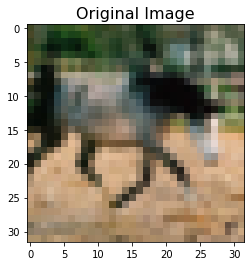

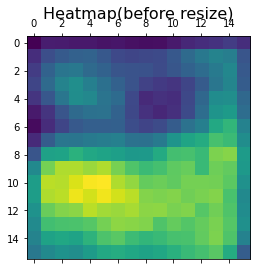

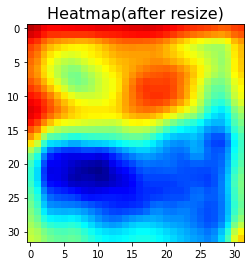

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


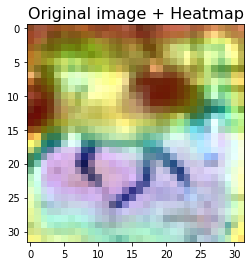

In [14]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Show a horse image x_train[52].
plt.imshow(x_train[52])
plt.title('Original Image', fontsize=16)

# Import the libraries
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np
import cv2

# Pick a horse image x_train[52] to show the heatmap.
img = x_train[52]
print('Shape of the image:', np.shape(img))

# 'x' is a numpy array of shape (32, 32, 3)
x = image.img_to_array(img)

# A dimension was added to increse the "batch", the dimension of the array is now (1, 32, 32, 3)
x = np.expand_dims(x, axis=0)

# This is the "horse" entry in the prediction vector, 7 is the class of horse
horse = model.output[:, 7]

# This is the output feature map of the 'conv2d_16' layer,
# the last convolutional layer in our architecture
last_conv_layer = model.get_layer('conv2d_16')

# This is the gradient of the "horse" class with regard to
# the output feature map of 'conv2d_16'
grads = K.gradients(horse, last_conv_layer.output)[0]


# This is a vector of shape (64,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# 'pooled_grads' and the output feature map of 'conv2d_16', given a sample image.
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of one horse
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array by "how important this channel is" with regard to the horse class
for i in range(10):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis= -1)

heatmap = np.abs(heatmap)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.title('Heatmap(before resize)', fontsize=16)
plt.show()


# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# Convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
#print(np.shape(heatmap),'after resize')
plt.imshow(heatmap)
plt.title('Heatmap(after resize)', fontsize=16)
plt.show()
superimposed_img = heatmap * 0.4 + img

superimposed_img = superimposed_img.astype(int)

# Save the image to disk
plt.imshow(superimposed_img)
plt.title('Original image + Heatmap', fontsize=16)
plt.show()
